In [1]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Upload files manually
from google.colab import files
uploaded = files.upload()

# Load the Walmart dataset
df = pd.read_csv('Walmart DataSet.csv')

# Check basic info
df.info()

# View first few rows
df.head()


Saving Walmart DataSet.csv to Walmart DataSet.csv
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Date          6435 non-null   object 
 2   Weekly_Sales  6435 non-null   float64
 3   Holiday_Flag  6435 non-null   int64  
 4   Temperature   6435 non-null   float64
 5   Fuel_Price    6435 non-null   float64
 6   CPI           6435 non-null   float64
 7   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 402.3+ KB


,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106


In [ ]:
# Basic checks
print(df.info())
print(df.describe())
print(df.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Date          6435 non-null   object 
 2   Weekly_Sales  6435 non-null   float64
 3   Holiday_Flag  6435 non-null   int64  
 4   Temperature   6435 non-null   float64
 5   Fuel_Price    6435 non-null   float64
 6   CPI           6435 non-null   float64
 7   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 402.3+ KB
None
             Store  Weekly_Sales  Holiday_Flag  Temperature   Fuel_Price  \
count  6435.000000  6.435000e+03   6435.000000  6435.000000  6435.000000   
mean     23.000000  1.046965e+06      0.069930    60.663782     3.358607   
std      12.988182  5.643666e+05      0.255049    18.444933     0.459020   
min       1.000000  2.099862e+05      0.000000    -2.060000     2.472000   
25%      12.000

In [2]:
#Handling Missing Values

df.isnull().sum()
# Add imputation or removal strategy
df.fillna(method='ffill', inplace=True)
df.isnull().sum()

<ipython-input-2-63ec80a1ad0a>:5: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


,0
Store,0
Date,0
Weekly_Sales,0
Holiday_Flag,0
Temperature,0
Fuel_Price,0
CPI,0
Unemployment,0


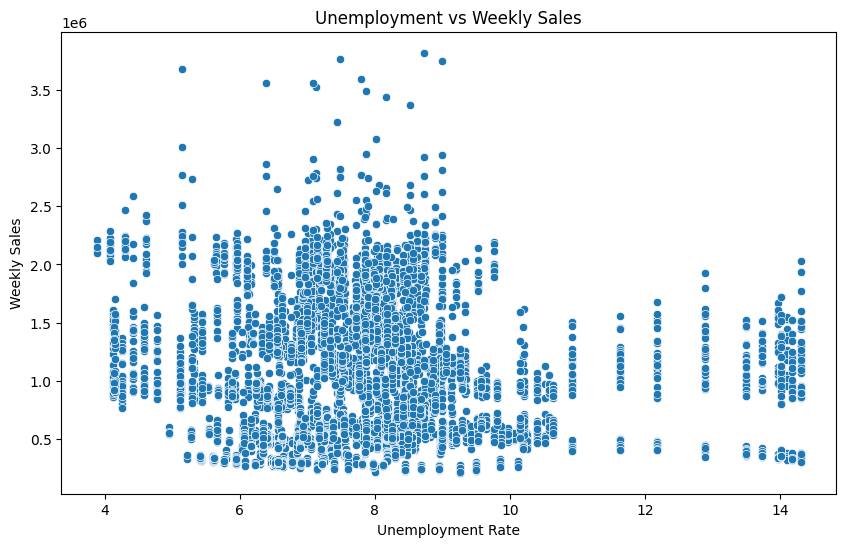

Correlation between Unemployment and Weekly Sales: -0.10617608965795429


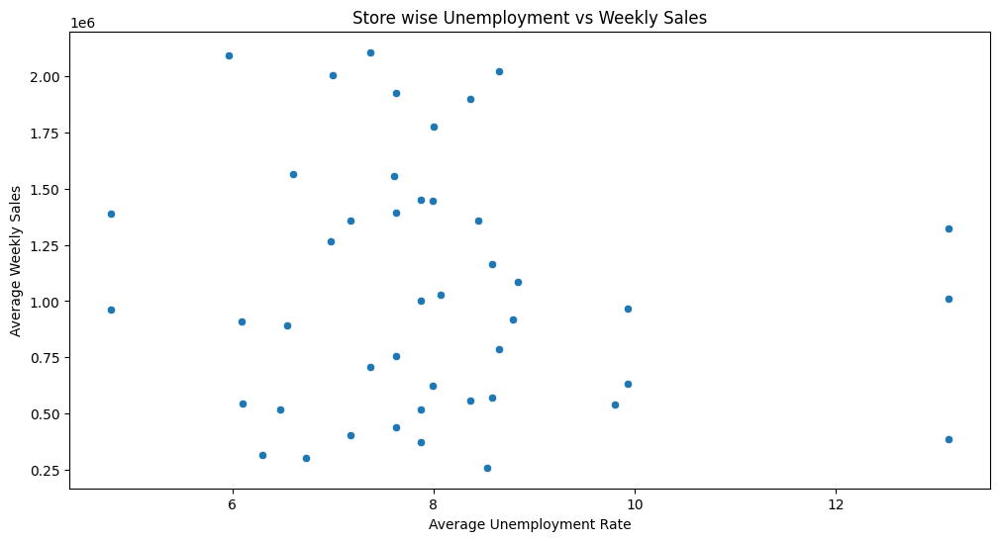

,Store,Unemployment,Weekly_Sales
37,38,13.116483,3.857317e+05
11,12,13.116483,1.009002e+06
27,28,13.116483,1.323522e+06
42,43,9.934804,6.333247e+05
33,34,9.934804,9.667816e+05


In [ ]:
# Step 1a: Analyzing impact of Unemployment on Weekly Sales

# Scatter plot to see relationship
plt.figure(figsize=(10,6))
sns.scatterplot(data=df, x='Unemployment', y='Weekly_Sales')
plt.title('Unemployment vs Weekly Sales')
plt.xlabel('Unemployment Rate')
plt.ylabel('Weekly Sales')
plt.show()

# Correlation
correlation = df['Unemployment'].corr(df['Weekly_Sales'])
print("Correlation between Unemployment and Weekly Sales:", correlation)

# Group by store and find average unemployment and sales
store_unemp_sales = df.groupby('Store').agg({'Unemployment':'mean', 'Weekly_Sales':'mean'}).reset_index()

# Scatter plot store-wise
plt.figure(figsize=(12,6))
sns.scatterplot(data=store_unemp_sales, x='Unemployment', y='Weekly_Sales')
plt.title('Store wise Unemployment vs Weekly Sales')
plt.xlabel('Average Unemployment Rate')
plt.ylabel('Average Weekly Sales')
plt.show()

# Find stores suffering the most (lowest average sales with highest unemployment)
store_unemp_sales.sort_values(by=['Unemployment', 'Weekly_Sales'], ascending=[False, True]).head()


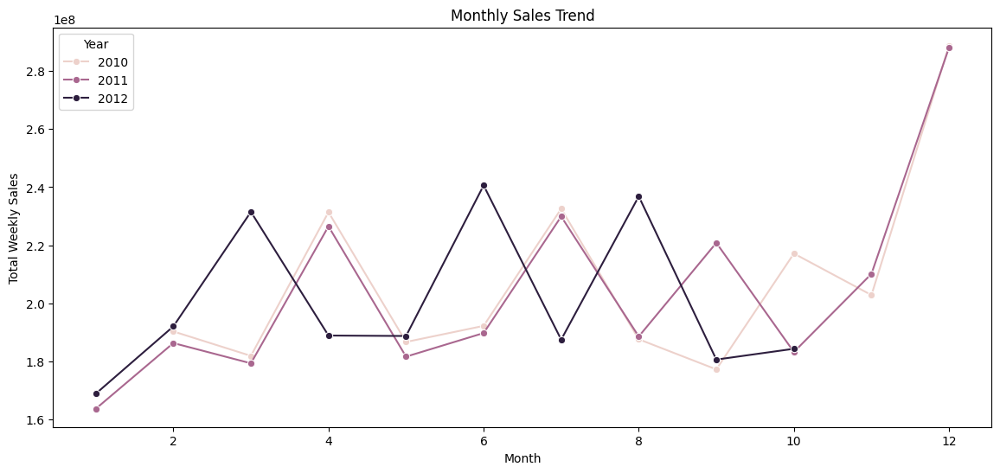

In [ ]:
# Step 1b: Checking for Seasonal Trends

# Convert 'Date' column to datetime properly
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)

# Extract Month and Year
df['Month'] = df['Date'].dt.month
df['Year'] = df['Date'].dt.year

# Aggregate monthly sales
monthly_sales = df.groupby(['Year', 'Month'])['Weekly_Sales'].sum().reset_index()

# Line plot
plt.figure(figsize=(14,6))
sns.lineplot(data=monthly_sales, x='Month', y='Weekly_Sales', hue='Year', marker='o')
plt.title('Monthly Sales Trend')
plt.xlabel('Month')
plt.ylabel('Total Weekly Sales')
plt.show()


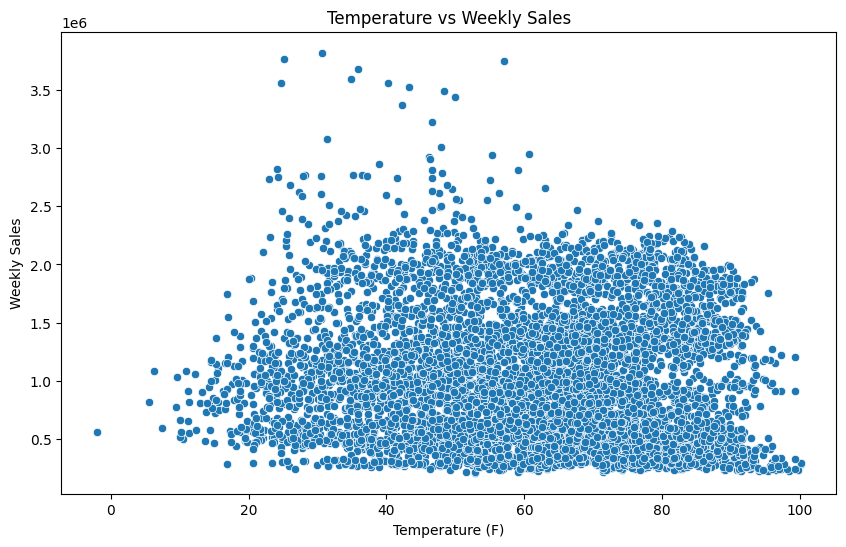

Correlation between Temperature and Weekly Sales: -0.06381001317946955


In [ ]:
# Step 1c: Analyzing impact of Temperature on Weekly Sales

# Scatter plot
plt.figure(figsize=(10,6))
sns.scatterplot(data=df, x='Temperature', y='Weekly_Sales')
plt.title('Temperature vs Weekly Sales')
plt.xlabel('Temperature (F)')
plt.ylabel('Weekly Sales')
plt.show()

# Correlation
correlation_temp = df['Temperature'].corr(df['Weekly_Sales'])
print("Correlation between Temperature and Weekly Sales:", correlation_temp)


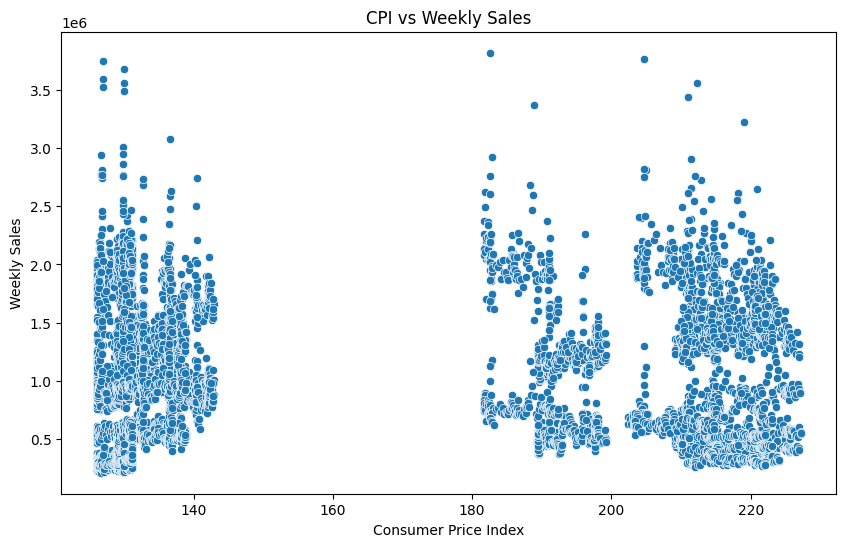

Correlation between CPI and Weekly Sales: -0.07263416204017632


In [ ]:
# Step 1d: Analyzing impact of CPI on Weekly Sales

# Scatter plot
plt.figure(figsize=(10,6))
sns.scatterplot(data=df, x='CPI', y='Weekly_Sales')
plt.title('CPI vs Weekly Sales')
plt.xlabel('Consumer Price Index')
plt.ylabel('Weekly Sales')
plt.show()

# Correlation
correlation_cpi = df['CPI'].corr(df['Weekly_Sales'])
print("Correlation between CPI and Weekly Sales:", correlation_cpi)


Top 5 Performing Stores:
   Store  Weekly_Sales
0     20  3.013978e+08
1      4  2.995440e+08
2     14  2.889999e+08
3     13  2.865177e+08
4      2  2.753824e+08


<ipython-input-8-eff672dd09fc>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Store', y='Weekly_Sales', data=store_sales.head(10), palette='viridis')


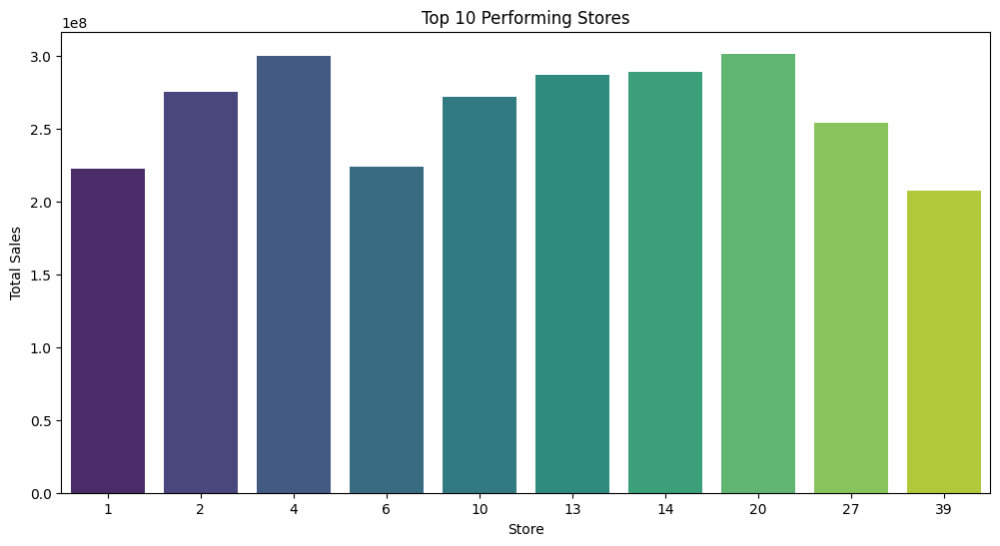

In [ ]:
# Step 1e: Finding Top Performing Stores

# Aggregate total sales per store
store_sales = df.groupby('Store')['Weekly_Sales'].sum().sort_values(ascending=False).reset_index()

# Display top 5 stores
print("Top 5 Performing Stores:")
print(store_sales.head())

# Bar plot
plt.figure(figsize=(12,6))
sns.barplot(x='Store', y='Weekly_Sales', data=store_sales.head(10), palette='viridis')
plt.title('Top 10 Performing Stores')
plt.xlabel('Store')
plt.ylabel('Total Sales')
plt.show()


In [ ]:
# Step 1f: Finding Worst Performing Store and Difference

# Already sorted in previous step
top_store_sales = store_sales.iloc[0]
bottom_store_sales = store_sales.iloc[-1]

print(f"Top Store: Store {top_store_sales['Store']} with Sales {top_store_sales['Weekly_Sales']}")
print(f"Worst Store: Store {bottom_store_sales['Store']} with Sales {bottom_store_sales['Weekly_Sales']}")

# Difference
difference = top_store_sales['Weekly_Sales'] - bottom_store_sales['Weekly_Sales']
print(f"Difference between Top and Worst Store Sales: {difference}")


Top Store: Store 20.0 with Sales 301397792.46
Worst Store: Store 33.0 with Sales 37160221.96
Difference between Top and Worst Store Sales: 264237570.49999997


In [ ]:
#Step 2

# Preparing the dataset

# Already loaded df from before
# Make sure 'Date' is datetime (already converted in Problem 1)

# We'll work with one store at a time
stores = df['Store'].unique()

# Check stores
print("Total stores:", len(stores))
print("Sample stores:", stores[:5])


Total stores: 45
Sample stores: [1 2 3 4 5]


In [ ]:
from prophet import Prophet

# Function to forecast for a single store

def forecast_sales_for_store(store_number):
    # Filter data for the store
    store_data = df[df['Store'] == store_number]

    # Aggregate by Date
    store_data = store_data.groupby('Date')['Weekly_Sales'].sum().reset_index()

    # Prophet requires columns: 'ds' (date) and 'y' (target)
    store_data = store_data.rename(columns={'Date': 'ds', 'Weekly_Sales': 'y'})

    # Initialize Prophet model
    model = Prophet(interval_width=0.95)
    model.fit(store_data)

    # Create future dataframe (12 weeks = 12 periods)
    future = model.make_future_dataframe(periods=12, freq='W')

    # Forecast
    forecast = model.predict(future)

    # Plot forecast
    model.plot(forecast)
    plt.title(f"Store {store_number} Sales Forecast")
    plt.xlabel('Date')
    plt.ylabel('Weekly Sales')
    plt.show()

    # Return forecasted values
    return forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(12)


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/kegtztn7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/bor4ihei.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61590', 'data', 'file=/tmp/tmpapqvvby3/kegtztn7.json', 'init=/tmp/tmpapqvvby3/bor4ihei.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_modelmouachl4/prophet_model-20250427073341.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:33:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:33:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


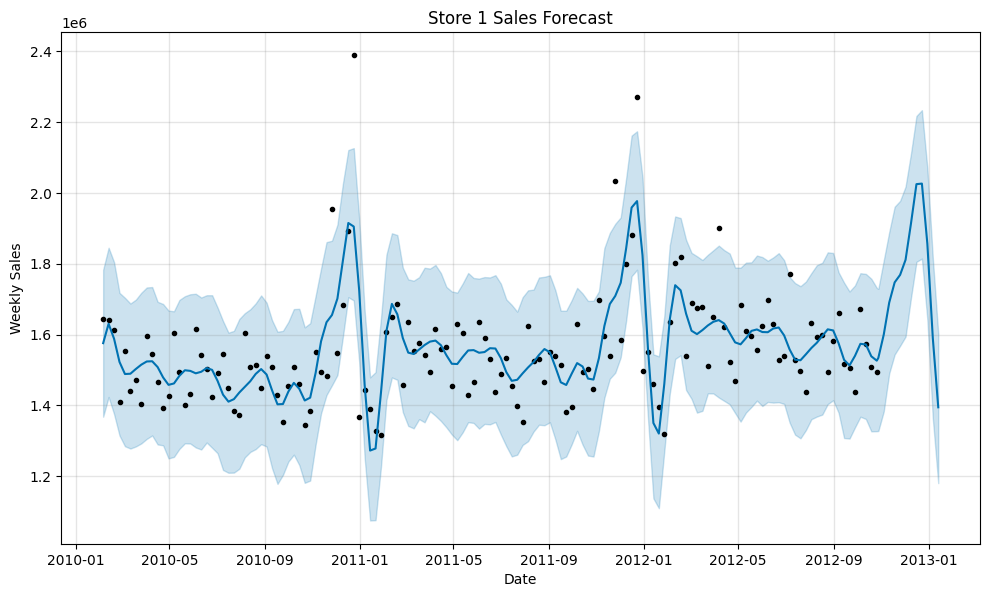

,ds,yhat,yhat_lower,yhat_upper
143,2012-10-28,1.533722e+06,1.327607e+06,1.728770e+06
144,2012-11-04,1.599966e+06,1.383150e+06,1.809479e+06
145,2012-11-11,1.690154e+06,1.490221e+06,1.889162e+06
146,2012-11-18,1.747222e+06,1.543613e+06,1.960842e+06
147,2012-11-25,1.768336e+06,1.568191e+06,1.977350e+06
148,2012-12-02,1.810911e+06,1.593993e+06,2.017575e+06
149,2012-12-09,1.913994e+06,1.703761e+06,2.111282e+06
150,2012-12-16,2.024516e+06,1.805152e+06,2.217000e+06
151,2012-12-23,2.026088e+06,1.814291e+06,2.233443e+06
152,2012-12-30,1.856234e+06,1.642421e+06,2.070139e+06


In [ ]:
# Forecast for store number 1
forecast_store_1 = forecast_sales_for_store(1)

# See the next 12 weeks forecast
forecast_store_1


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/wblh_bav.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/mk9wjztd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79139', 'data', 'file=/tmp/tmpapqvvby3/wblh_bav.json', 'init=/tmp/tmpapqvvby3/mk9wjztd.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_modelt4d0gn_m/prophet_model-20250427074359.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:43:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:43:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 1...


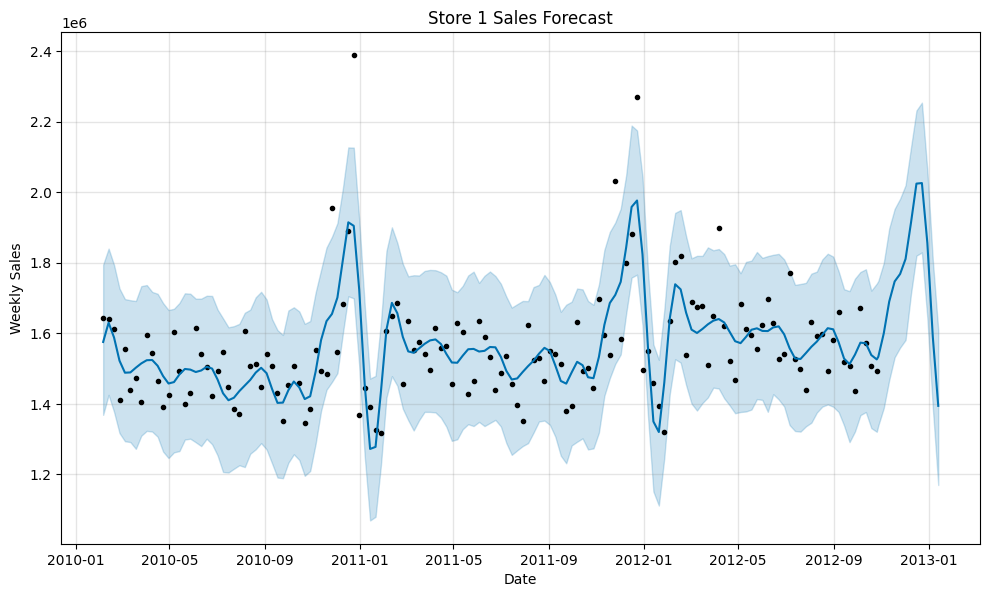

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/oo_ssi6b.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/c3iljxsv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34992', 'data', 'file=/tmp/tmpapqvvby3/oo_ssi6b.json', 'init=/tmp/tmpapqvvby3/c3iljxsv.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_modeli384xk0_/prophet_model-20250427074400.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 2...


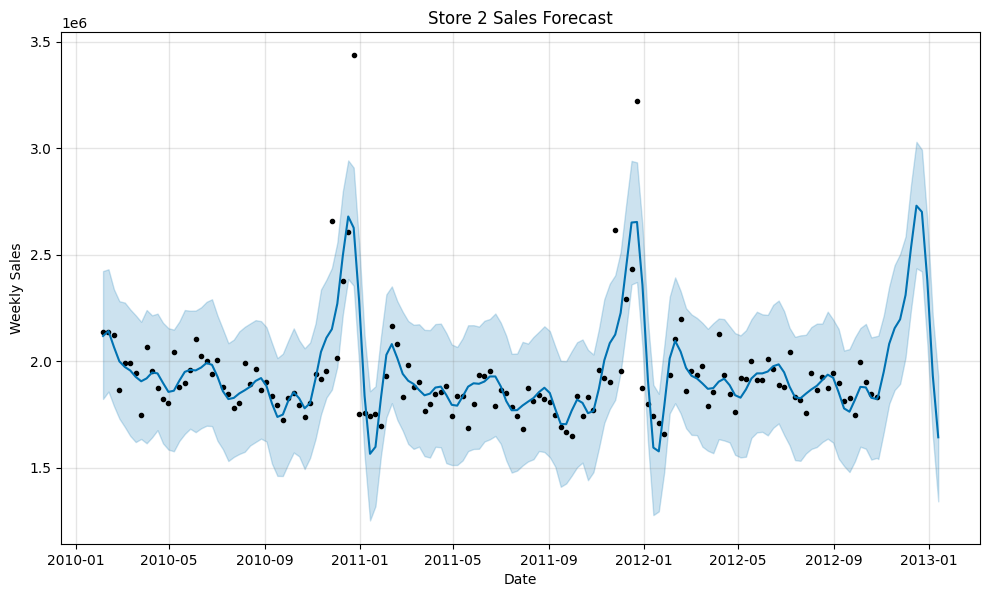

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/5g8ig1vv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/9jgecpoh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24948', 'data', 'file=/tmp/tmpapqvvby3/5g8ig1vv.json', 'init=/tmp/tmpapqvvby3/9jgecpoh.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_model2asz6l1c/prophet_model-20250427074400.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 3...


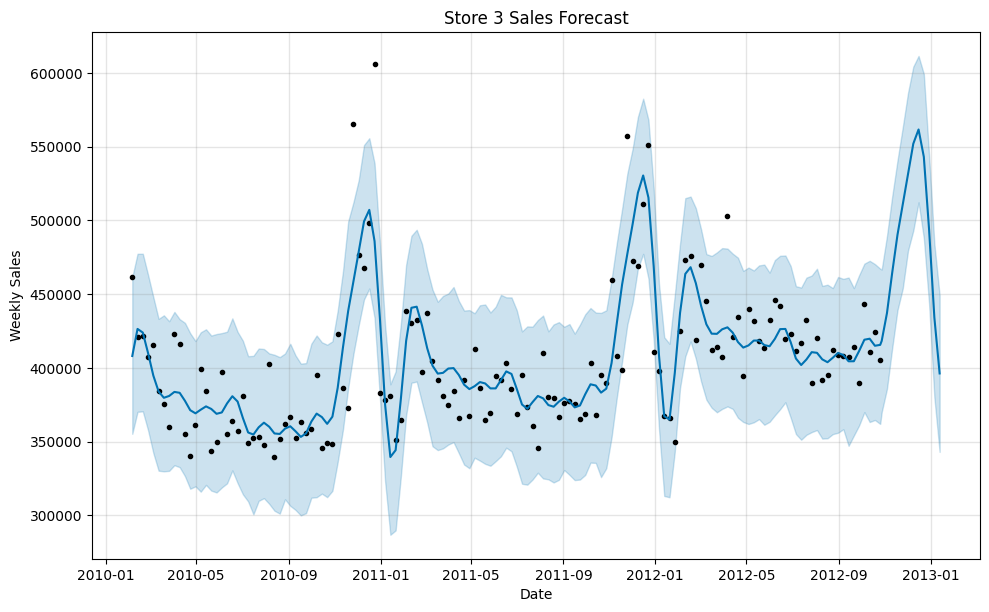

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/laiilnqr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/_ke3wbe4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92615', 'data', 'file=/tmp/tmpapqvvby3/laiilnqr.json', 'init=/tmp/tmpapqvvby3/_ke3wbe4.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_model77nx1tb0/prophet_model-20250427074401.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 4...


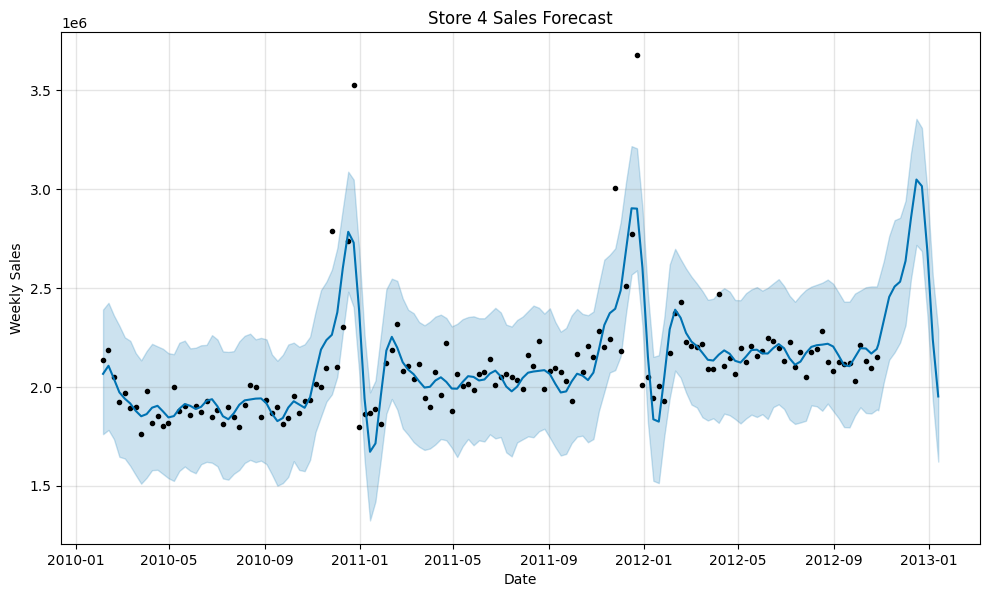

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/0ifr_2ay.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/csl0ujrx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=31874', 'data', 'file=/tmp/tmpapqvvby3/0ifr_2ay.json', 'init=/tmp/tmpapqvvby3/csl0ujrx.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_modelsgd08sx_/prophet_model-20250427074401.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 5...


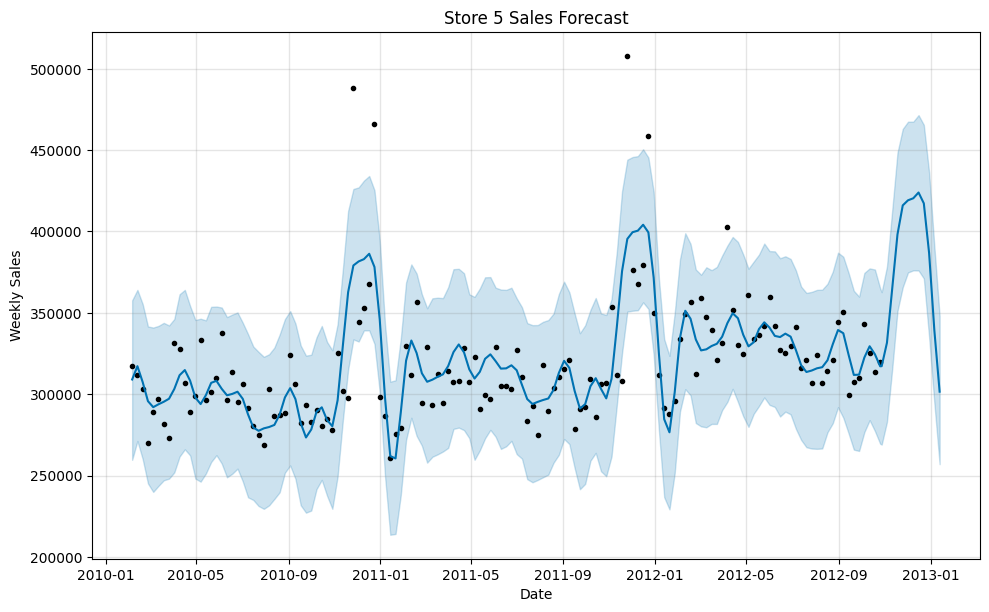

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/k8fwyblq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/rerefsax.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45043', 'data', 'file=/tmp/tmpapqvvby3/k8fwyblq.json', 'init=/tmp/tmpapqvvby3/rerefsax.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_modely5txld5g/prophet_model-20250427074402.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 6...


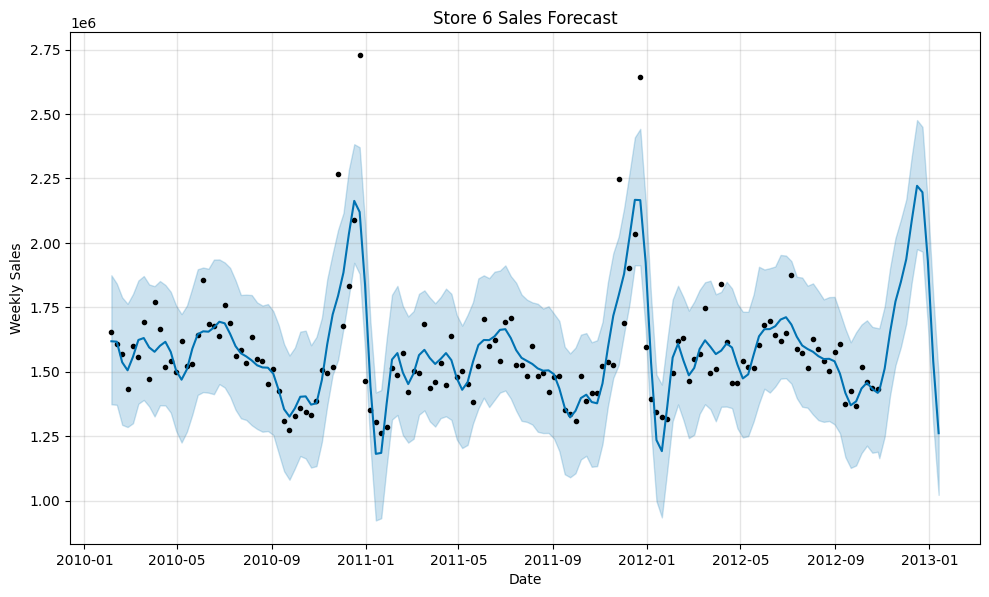

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/gnjvi5te.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/o0nob1a_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23169', 'data', 'file=/tmp/tmpapqvvby3/gnjvi5te.json', 'init=/tmp/tmpapqvvby3/o0nob1a_.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_model694eqdiu/prophet_model-20250427074402.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 7...


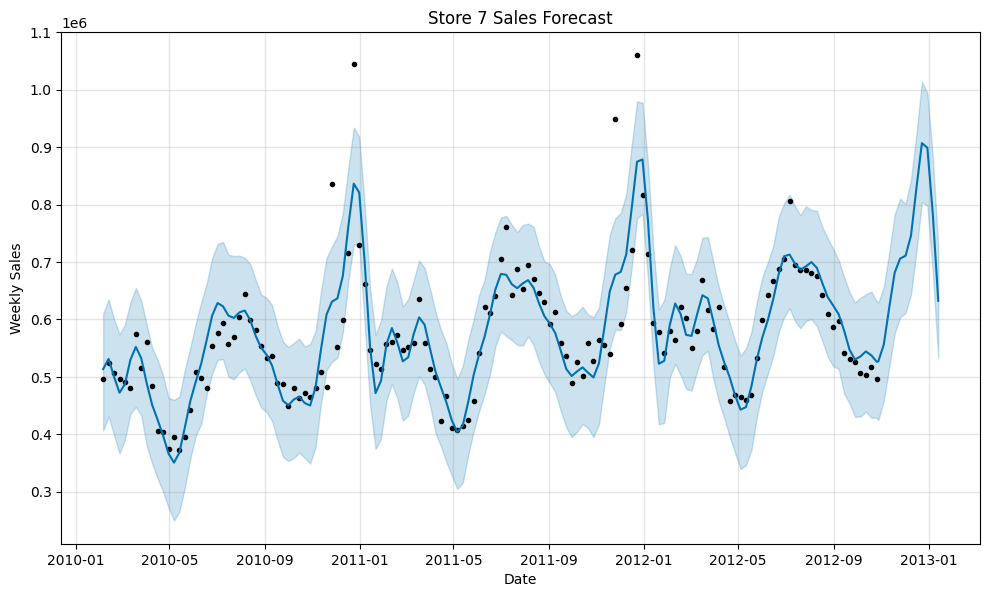

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/j_oeh1fo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/jdrk422m.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4894', 'data', 'file=/tmp/tmpapqvvby3/j_oeh1fo.json', 'init=/tmp/tmpapqvvby3/jdrk422m.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_model47bl9b5n/prophet_model-20250427074402.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 8...


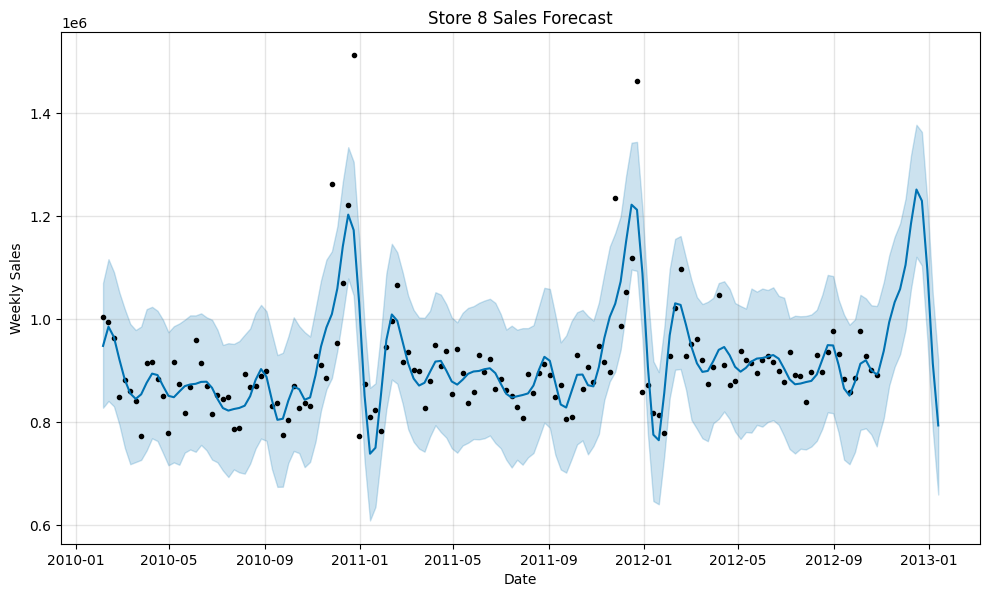

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/wnezwq06.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/ql4yjqai.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=81826', 'data', 'file=/tmp/tmpapqvvby3/wnezwq06.json', 'init=/tmp/tmpapqvvby3/ql4yjqai.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_modelep3bjwrr/prophet_model-20250427074403.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 9...


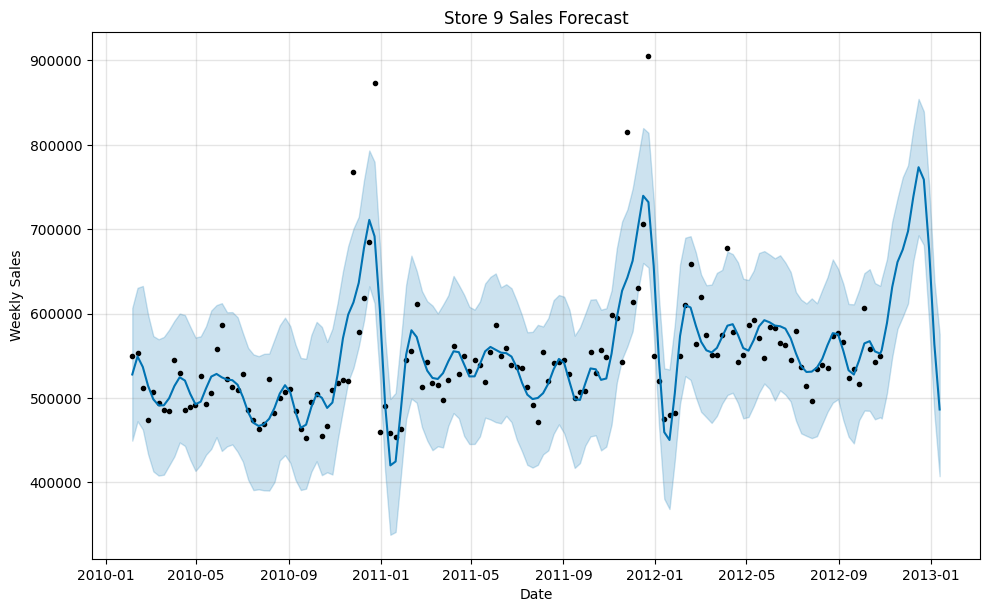

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/z9ugv2c1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/s_8g7hj9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=49228', 'data', 'file=/tmp/tmpapqvvby3/z9ugv2c1.json', 'init=/tmp/tmpapqvvby3/s_8g7hj9.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_modelj9ch09mf/prophet_model-20250427074403.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 10...


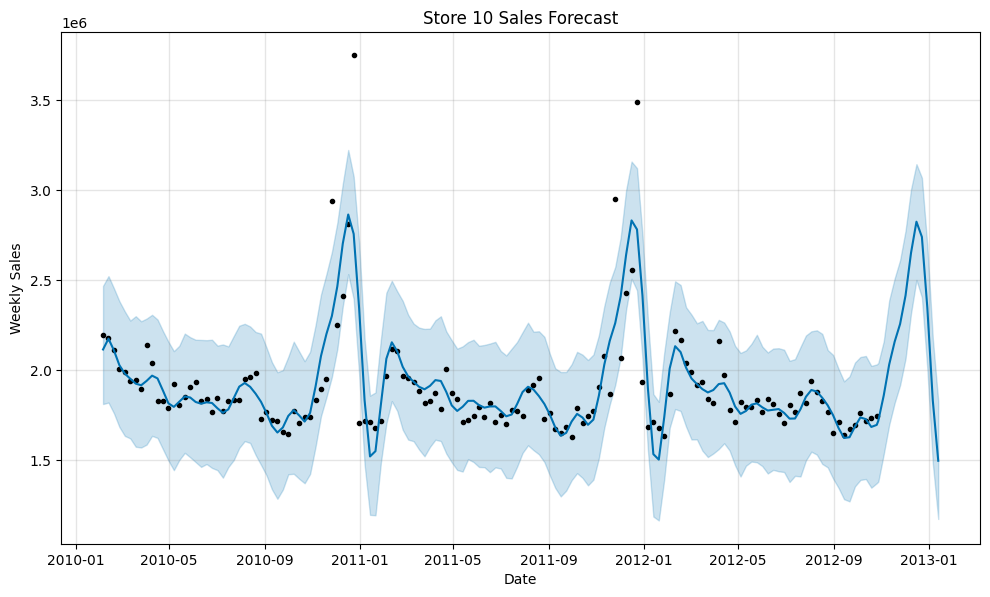

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/7gg_bvwz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/4vwgkjfu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=50169', 'data', 'file=/tmp/tmpapqvvby3/7gg_bvwz.json', 'init=/tmp/tmpapqvvby3/4vwgkjfu.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_modelprkxt981/prophet_model-20250427074404.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 11...


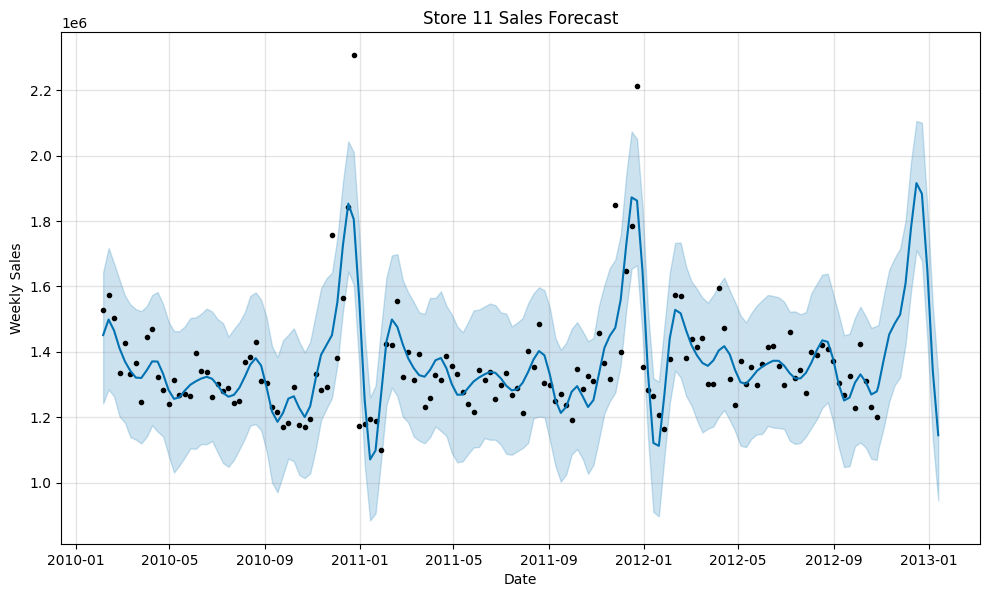

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/1e80ibto.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/503s71qd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28816', 'data', 'file=/tmp/tmpapqvvby3/1e80ibto.json', 'init=/tmp/tmpapqvvby3/503s71qd.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_modeleyebs9la/prophet_model-20250427074404.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 12...


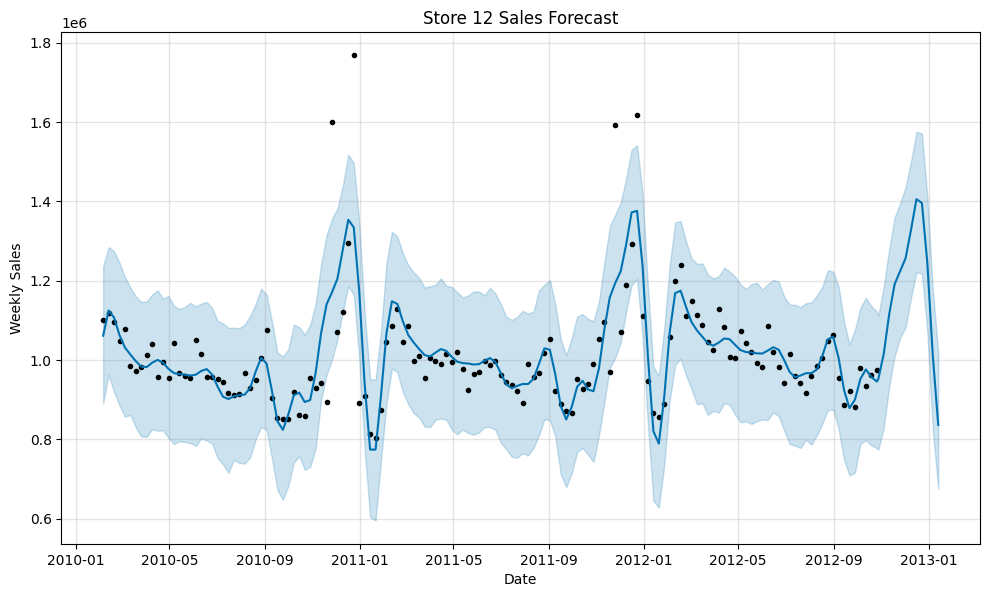

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/omho5xcx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/9r4mdfgv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79557', 'data', 'file=/tmp/tmpapqvvby3/omho5xcx.json', 'init=/tmp/tmpapqvvby3/9r4mdfgv.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_model8lsq3m1b/prophet_model-20250427074405.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 13...


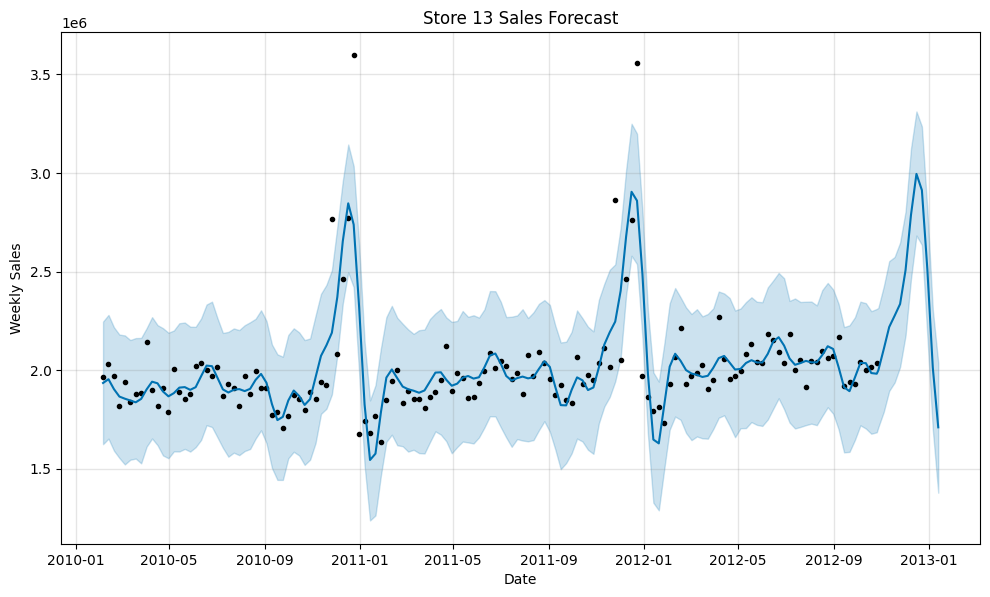

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/2ulr56ol.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/g9jogo_e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=48246', 'data', 'file=/tmp/tmpapqvvby3/2ulr56ol.json', 'init=/tmp/tmpapqvvby3/g9jogo_e.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_model7qvay8w4/prophet_model-20250427074405.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 14...


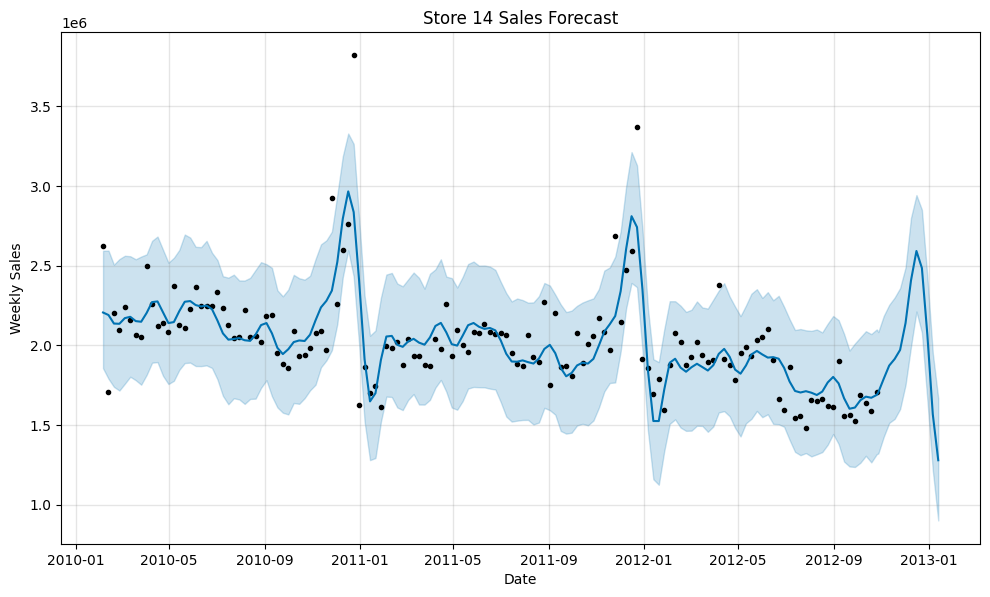

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/klvqk2mq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/vdna44w8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34534', 'data', 'file=/tmp/tmpapqvvby3/klvqk2mq.json', 'init=/tmp/tmpapqvvby3/vdna44w8.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_modelumqyj2r8/prophet_model-20250427074406.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 15...


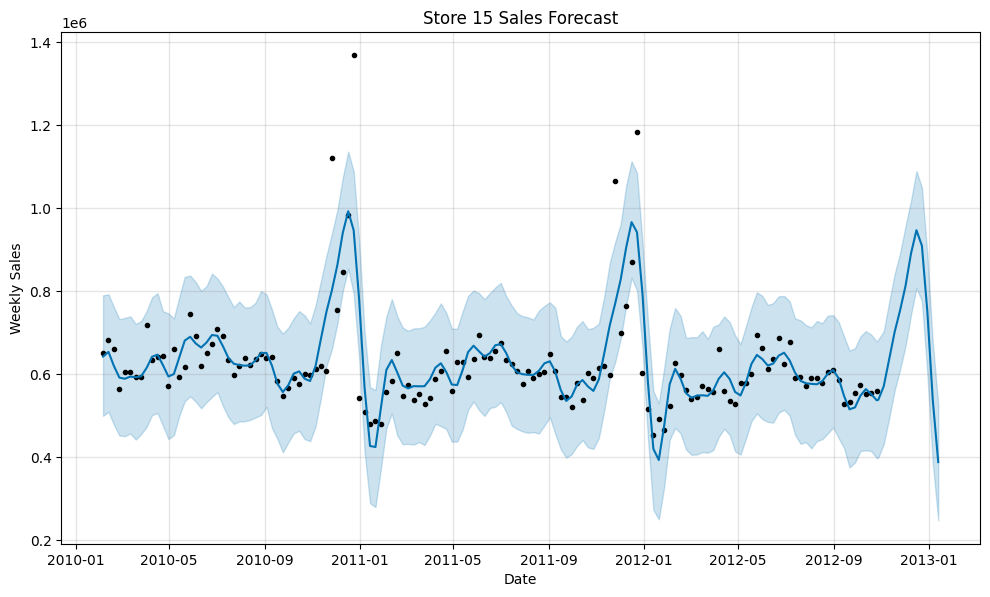

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/u4t1osle.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/2ky2_pd1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=56758', 'data', 'file=/tmp/tmpapqvvby3/u4t1osle.json', 'init=/tmp/tmpapqvvby3/2ky2_pd1.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_modelrw3t_zdc/prophet_model-20250427074406.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 16...


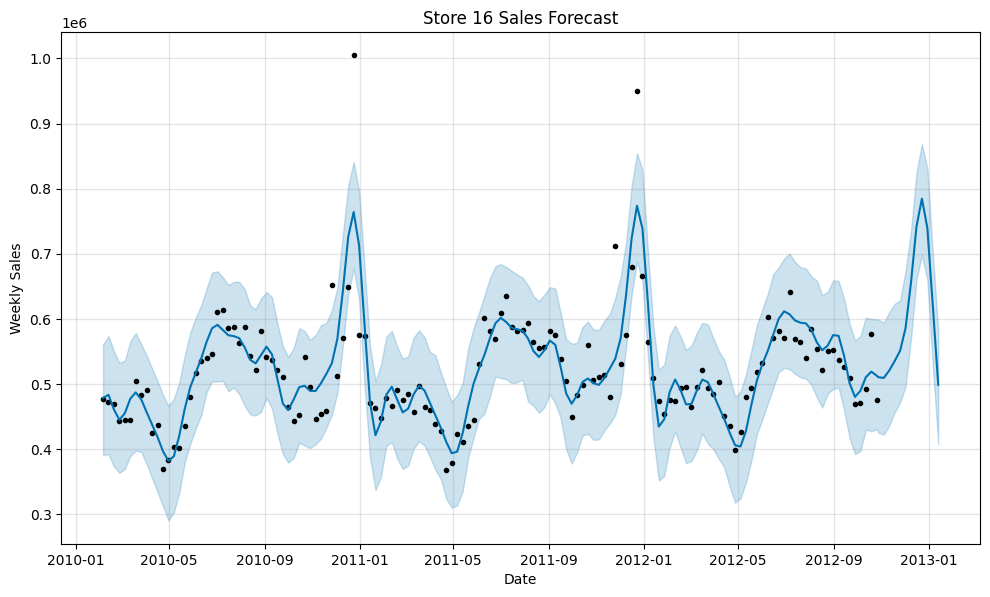

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/hfapeaph.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/_9c1zrzb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=67801', 'data', 'file=/tmp/tmpapqvvby3/hfapeaph.json', 'init=/tmp/tmpapqvvby3/_9c1zrzb.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_model9u7i0otj/prophet_model-20250427074407.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 17...


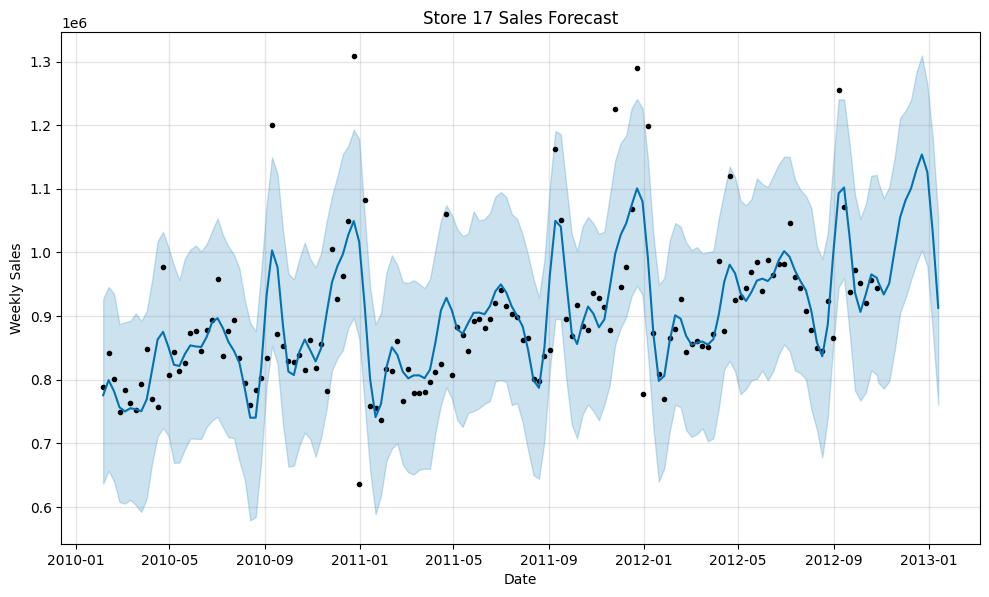

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/_jimjs84.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/jnd90ctm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85848', 'data', 'file=/tmp/tmpapqvvby3/_jimjs84.json', 'init=/tmp/tmpapqvvby3/jnd90ctm.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_modelabtmxmdp/prophet_model-20250427074408.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 18...


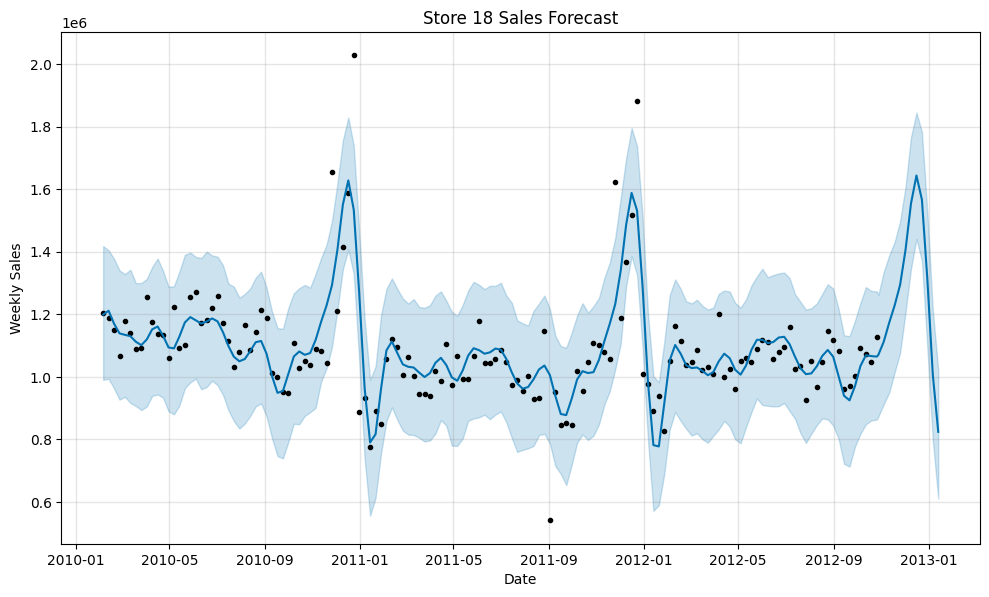

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/c73yn8go.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/bukgyjn_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46864', 'data', 'file=/tmp/tmpapqvvby3/c73yn8go.json', 'init=/tmp/tmpapqvvby3/bukgyjn_.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_modelmlfswirc/prophet_model-20250427074409.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 19...


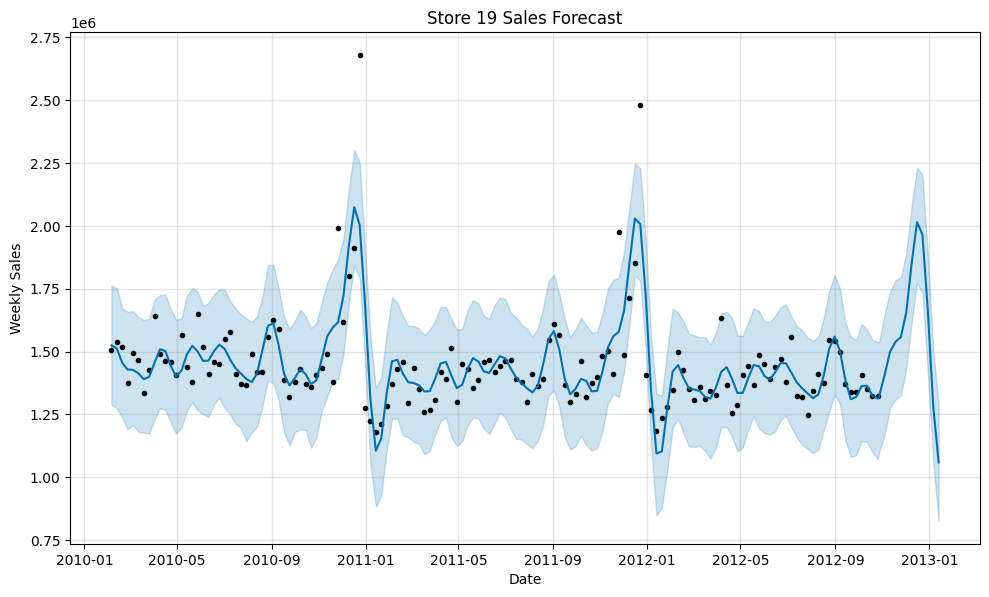

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/uoxi43lj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/1s66h20r.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8318', 'data', 'file=/tmp/tmpapqvvby3/uoxi43lj.json', 'init=/tmp/tmpapqvvby3/1s66h20r.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_model8wwt6egk/prophet_model-20250427074409.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 20...


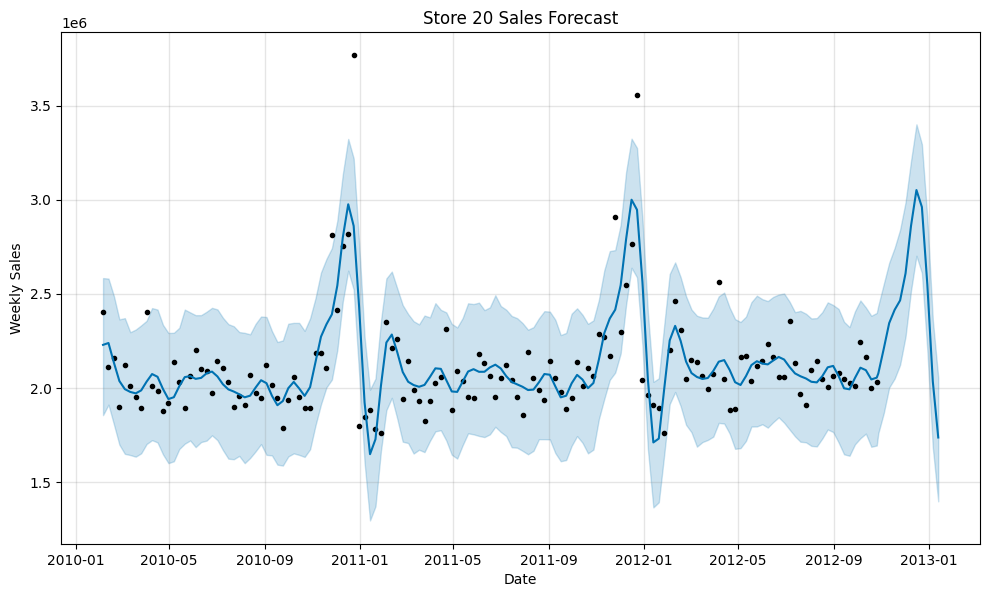

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/ocvnzmtv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/8nyam__v.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87778', 'data', 'file=/tmp/tmpapqvvby3/ocvnzmtv.json', 'init=/tmp/tmpapqvvby3/8nyam__v.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_modelbx8384eg/prophet_model-20250427074410.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 21...


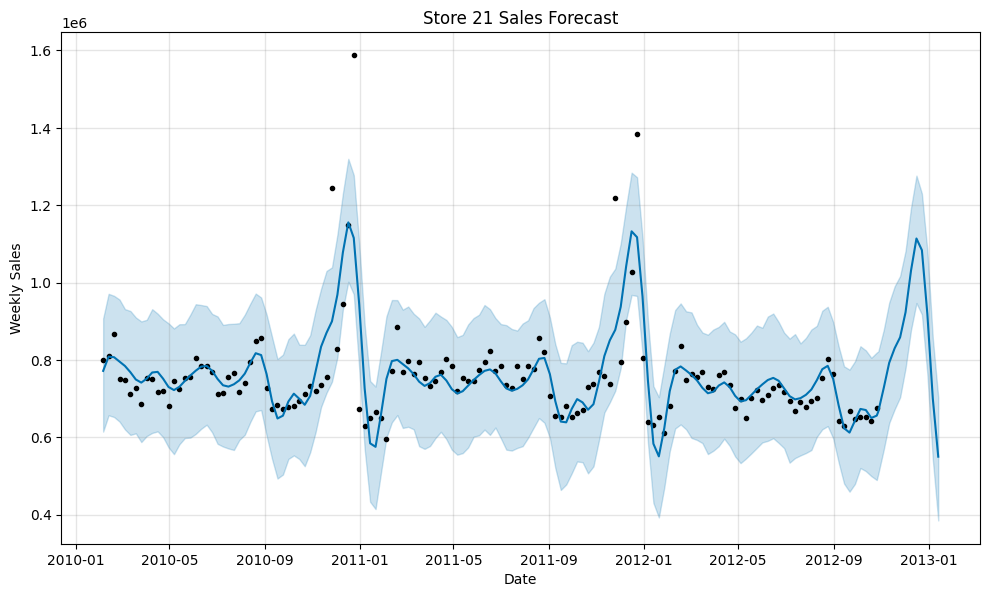

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/ihermdq0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/_v1_rbfn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70370', 'data', 'file=/tmp/tmpapqvvby3/ihermdq0.json', 'init=/tmp/tmpapqvvby3/_v1_rbfn.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_modelgw9n3f2c/prophet_model-20250427074411.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 22...


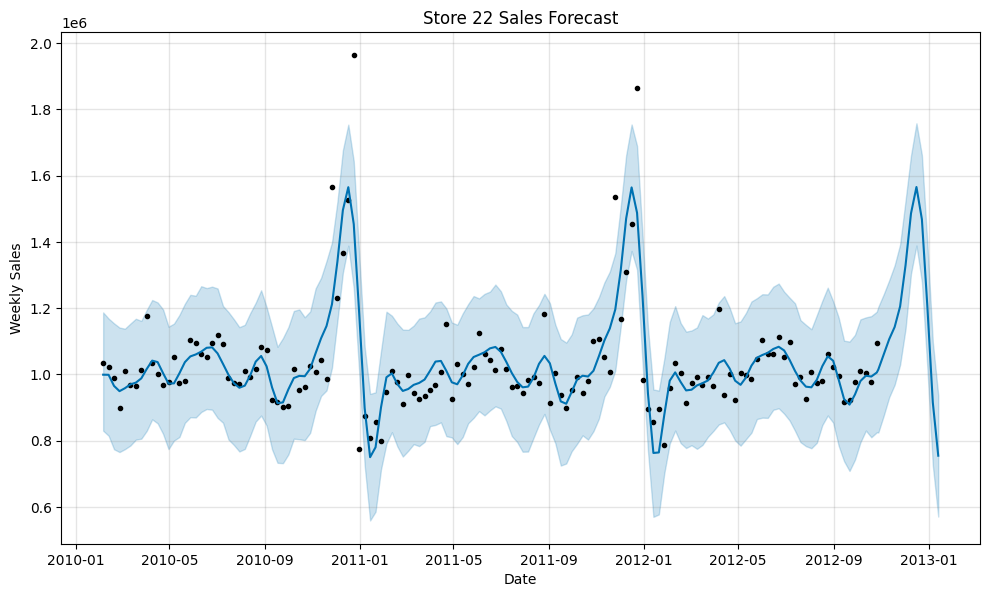

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/um8r92mp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/6l3wh9td.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=63864', 'data', 'file=/tmp/tmpapqvvby3/um8r92mp.json', 'init=/tmp/tmpapqvvby3/6l3wh9td.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_model85df_6wr/prophet_model-20250427074411.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 23...


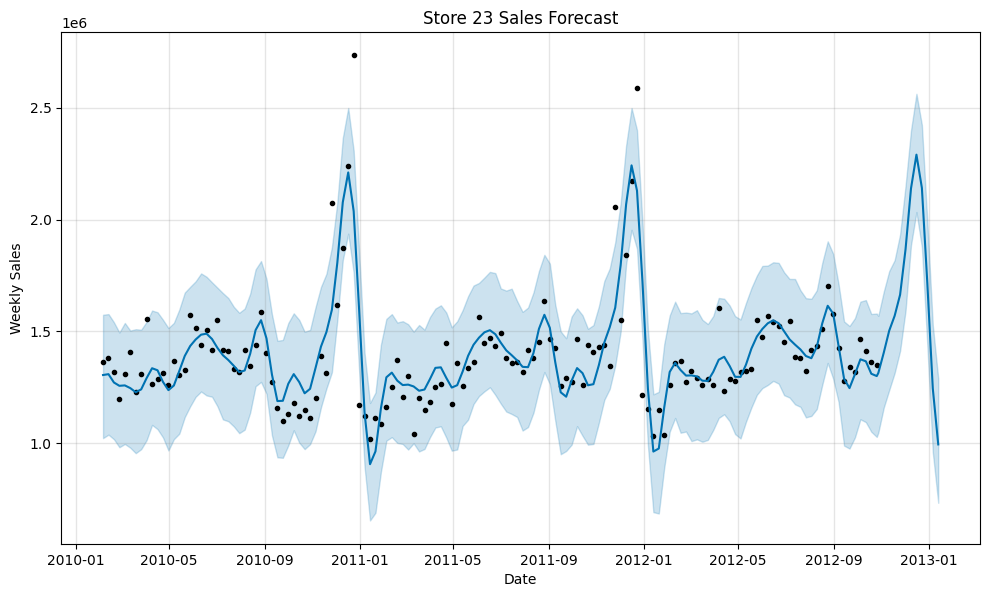

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/l64jxgwe.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/1fum1wlw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=63050', 'data', 'file=/tmp/tmpapqvvby3/l64jxgwe.json', 'init=/tmp/tmpapqvvby3/1fum1wlw.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_modelsjdniuuh/prophet_model-20250427074412.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 24...


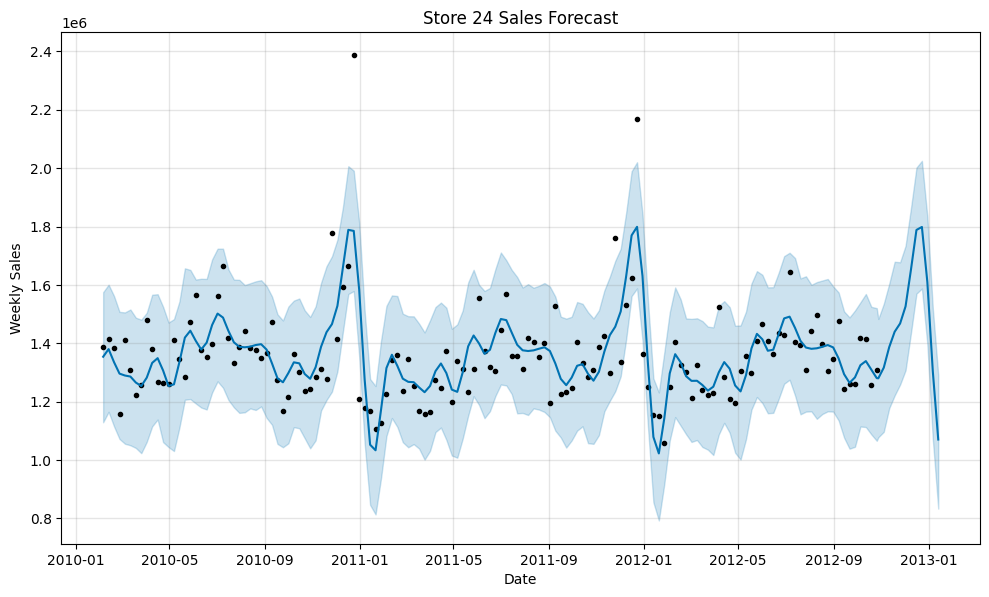

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/c9trl4ga.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/49iep6u7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=81531', 'data', 'file=/tmp/tmpapqvvby3/c9trl4ga.json', 'init=/tmp/tmpapqvvby3/49iep6u7.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_modely54nbp19/prophet_model-20250427074412.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 25...


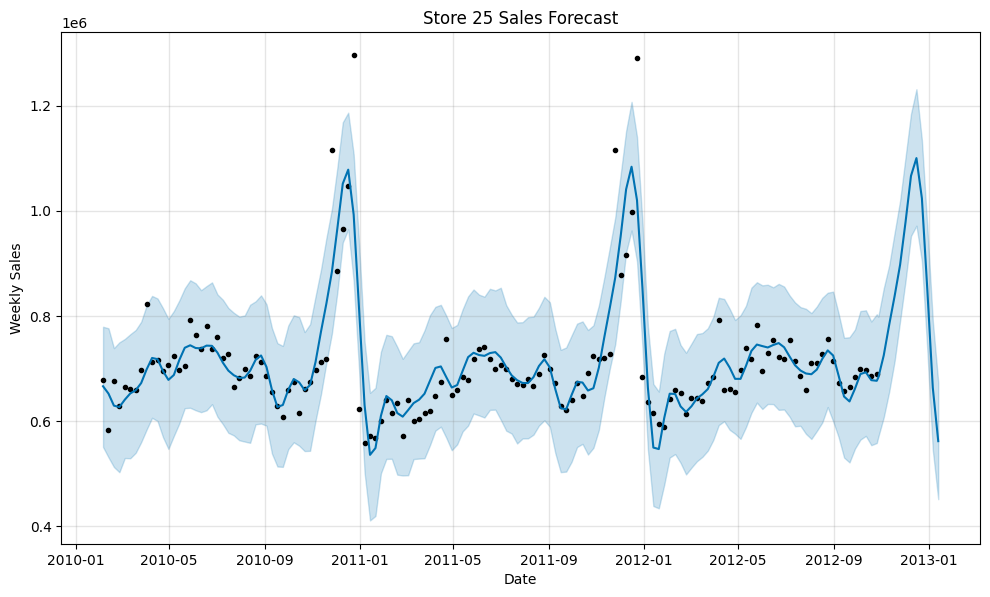

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/06suw8vy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/wzo_wgvb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2609', 'data', 'file=/tmp/tmpapqvvby3/06suw8vy.json', 'init=/tmp/tmpapqvvby3/wzo_wgvb.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_model8_bjimvx/prophet_model-20250427074413.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 26...


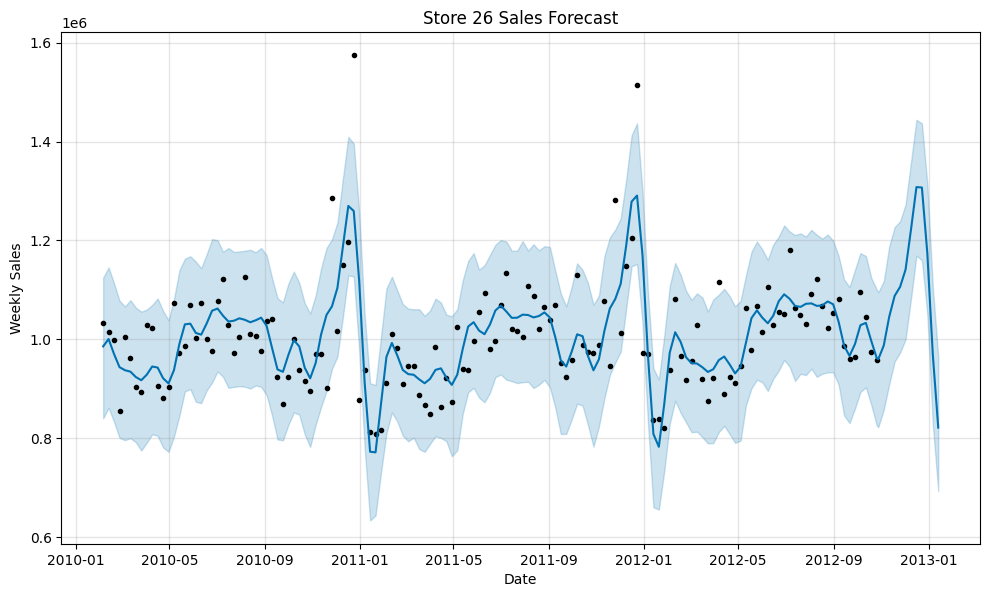

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/50bgjw24.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/fflywac9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=74273', 'data', 'file=/tmp/tmpapqvvby3/50bgjw24.json', 'init=/tmp/tmpapqvvby3/fflywac9.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_model9j607bgc/prophet_model-20250427074413.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 27...


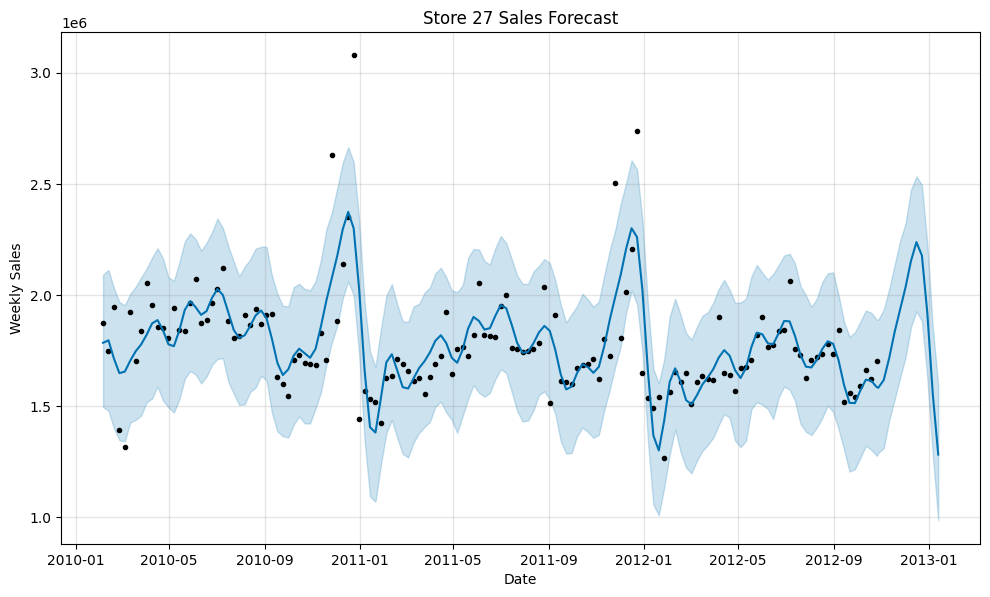

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/kn9c37pm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/6bgu19gx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2413', 'data', 'file=/tmp/tmpapqvvby3/kn9c37pm.json', 'init=/tmp/tmpapqvvby3/6bgu19gx.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_modelwzlexi5l/prophet_model-20250427074414.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 28...


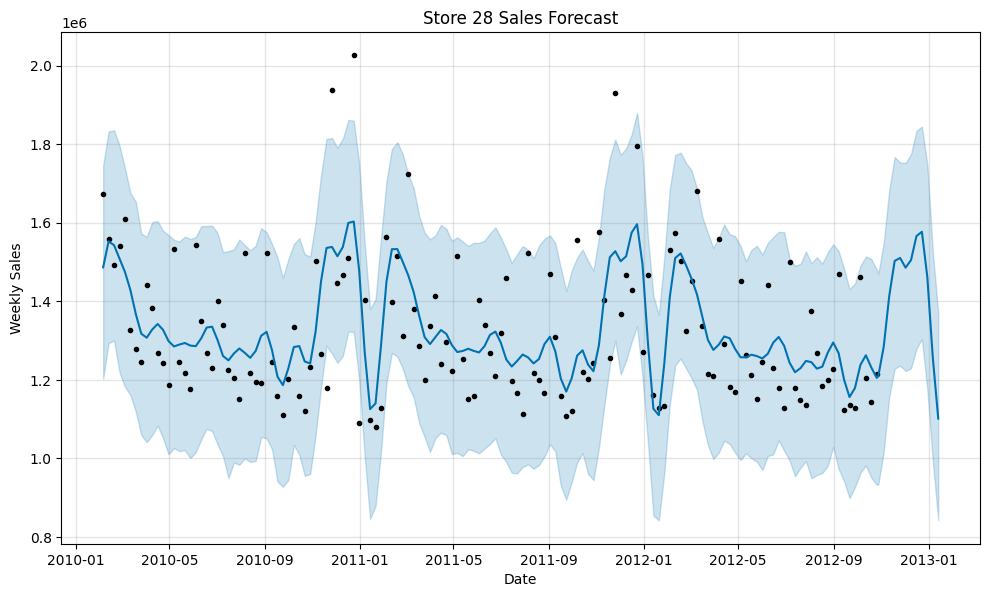

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/j_1j7mx7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/i9nqq3dl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=16645', 'data', 'file=/tmp/tmpapqvvby3/j_1j7mx7.json', 'init=/tmp/tmpapqvvby3/i9nqq3dl.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_modelntiag77o/prophet_model-20250427074415.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 29...


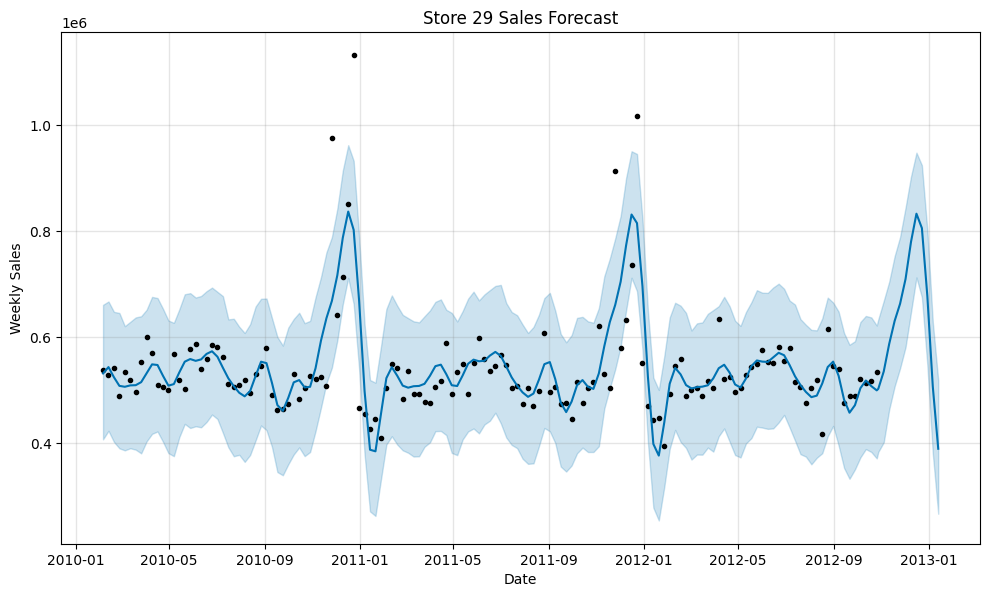

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/kot_vhry.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/oo6gq3mo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=17090', 'data', 'file=/tmp/tmpapqvvby3/kot_vhry.json', 'init=/tmp/tmpapqvvby3/oo6gq3mo.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_modelb5jl21lc/prophet_model-20250427074415.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 30...


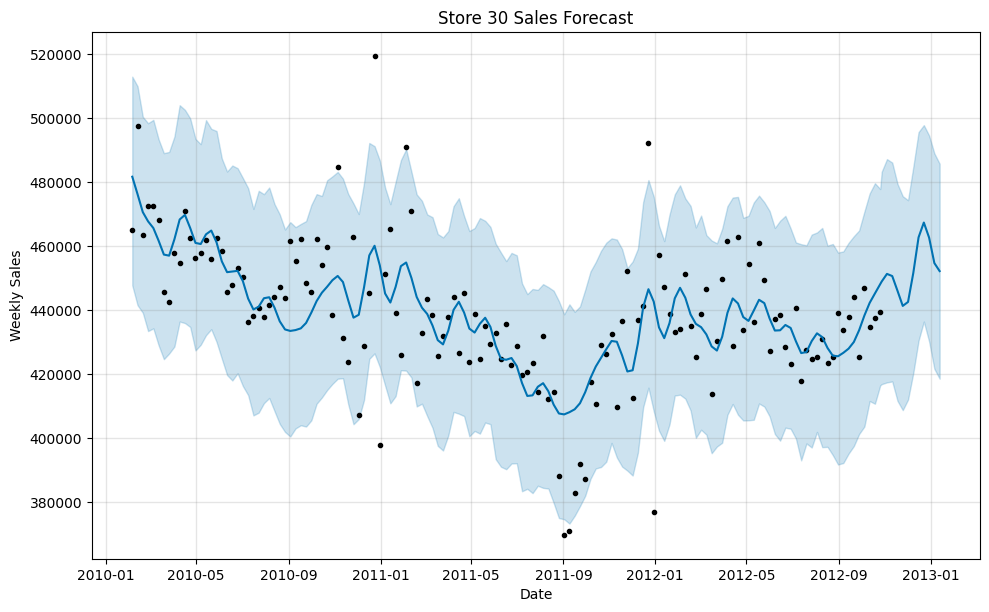

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/i7vftpbe.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/7uperu87.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85938', 'data', 'file=/tmp/tmpapqvvby3/i7vftpbe.json', 'init=/tmp/tmpapqvvby3/7uperu87.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_modelkvr__fz1/prophet_model-20250427074416.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 31...


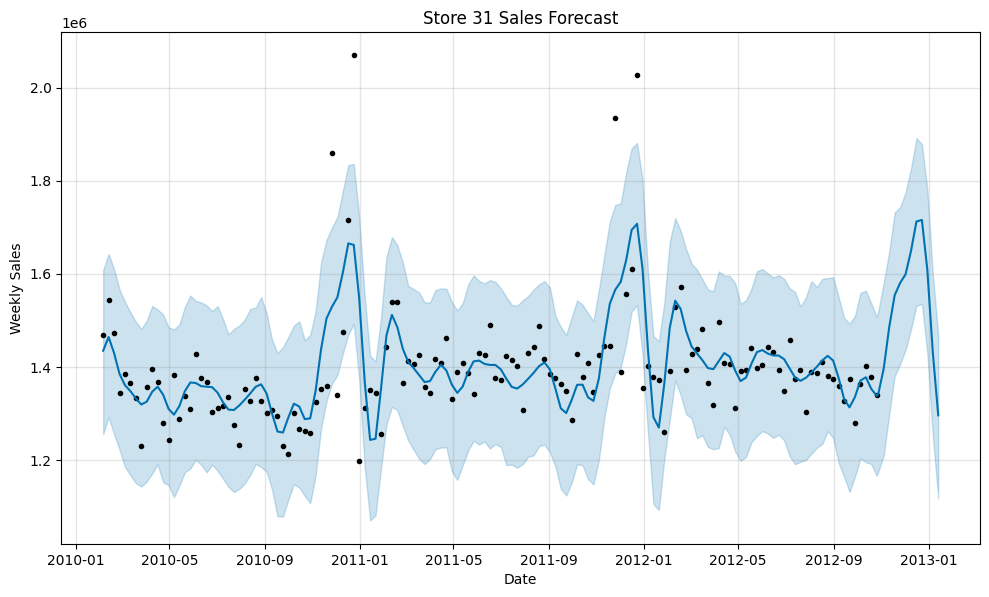

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/hn60by3m.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/dry5ikfx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79945', 'data', 'file=/tmp/tmpapqvvby3/hn60by3m.json', 'init=/tmp/tmpapqvvby3/dry5ikfx.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_modelvwxjjm3u/prophet_model-20250427074416.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 32...


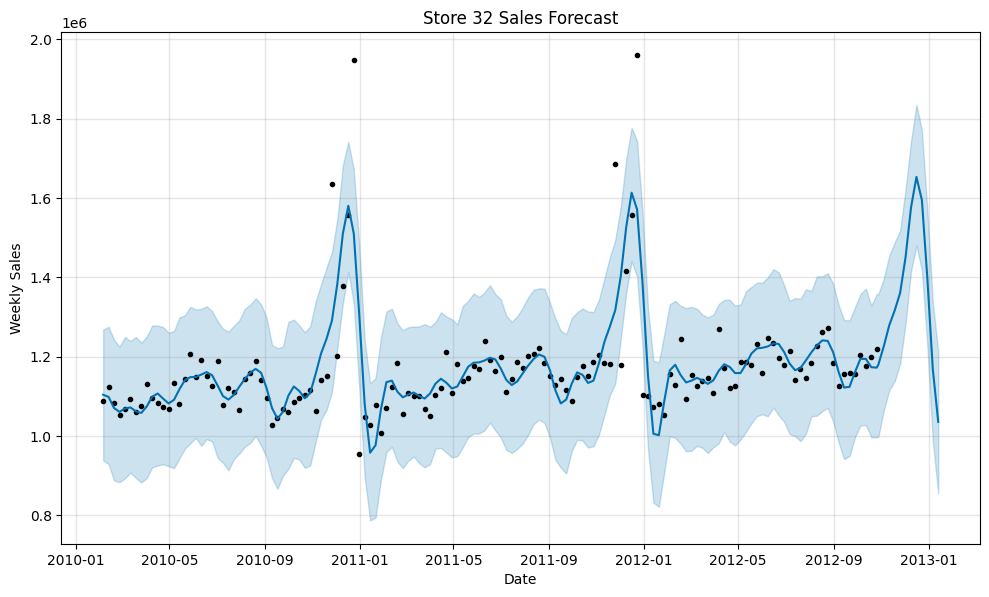

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/e6_qwotm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/e12cej_p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22761', 'data', 'file=/tmp/tmpapqvvby3/e6_qwotm.json', 'init=/tmp/tmpapqvvby3/e12cej_p.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_model78y3oh01/prophet_model-20250427074417.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 33...


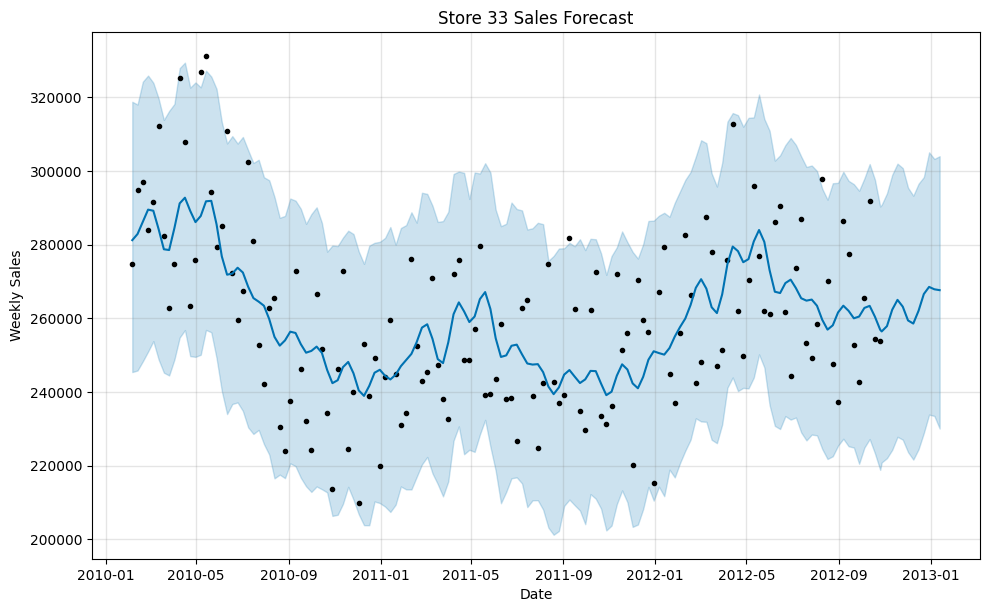

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/ont99t32.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/rgxhe12d.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=29763', 'data', 'file=/tmp/tmpapqvvby3/ont99t32.json', 'init=/tmp/tmpapqvvby3/rgxhe12d.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_model6h4b3_dv/prophet_model-20250427074417.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 34...


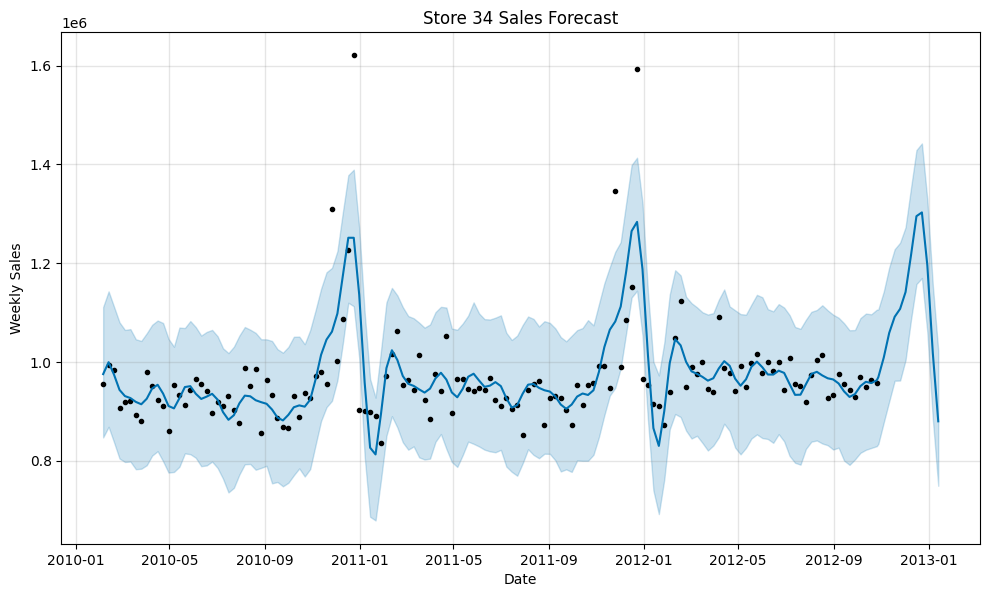

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/dc19cpn3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/l2tq3vj4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=51162', 'data', 'file=/tmp/tmpapqvvby3/dc19cpn3.json', 'init=/tmp/tmpapqvvby3/l2tq3vj4.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_modelc37yvuwt/prophet_model-20250427074418.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 35...


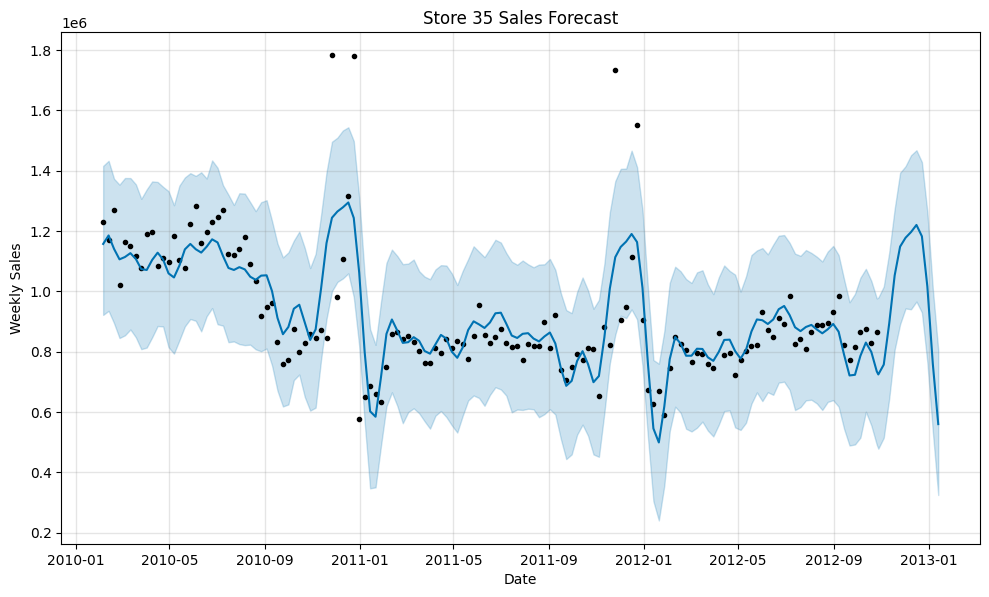

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/7yrkmro0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/_yyefn2i.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=29717', 'data', 'file=/tmp/tmpapqvvby3/7yrkmro0.json', 'init=/tmp/tmpapqvvby3/_yyefn2i.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_modellnk6pwdu/prophet_model-20250427074418.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 36...


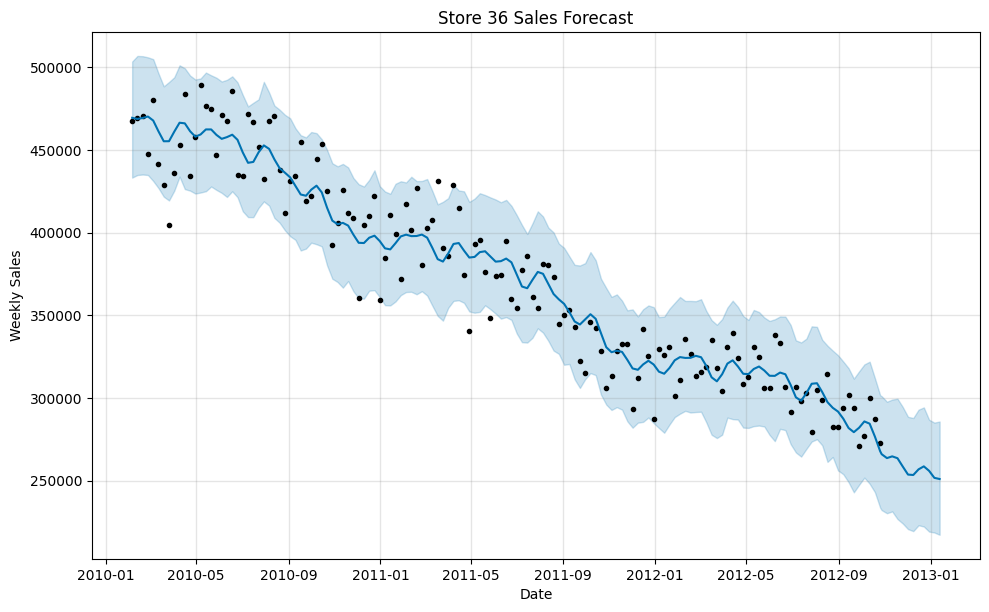

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/cbeo_gcn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/kjdtjagk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=21395', 'data', 'file=/tmp/tmpapqvvby3/cbeo_gcn.json', 'init=/tmp/tmpapqvvby3/kjdtjagk.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_model79k370ov/prophet_model-20250427074419.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 37...


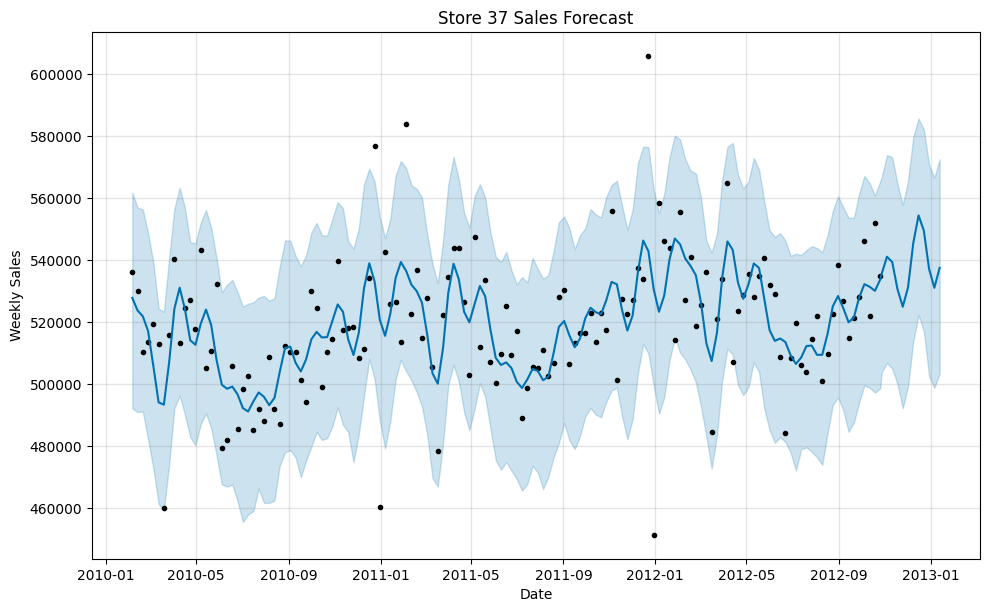

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/6eu566ys.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/cfje9v22.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22067', 'data', 'file=/tmp/tmpapqvvby3/6eu566ys.json', 'init=/tmp/tmpapqvvby3/cfje9v22.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_modelwziv_0wd/prophet_model-20250427074420.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 38...


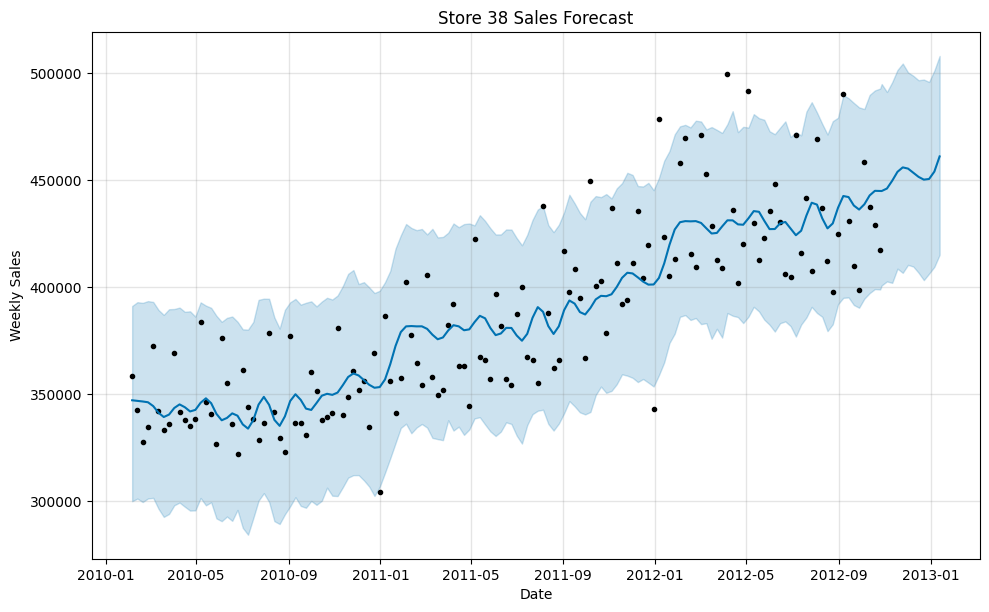

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/rr2bg6u5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/qy_n4wcx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64775', 'data', 'file=/tmp/tmpapqvvby3/rr2bg6u5.json', 'init=/tmp/tmpapqvvby3/qy_n4wcx.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_modell783rt76/prophet_model-20250427074420.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 39...


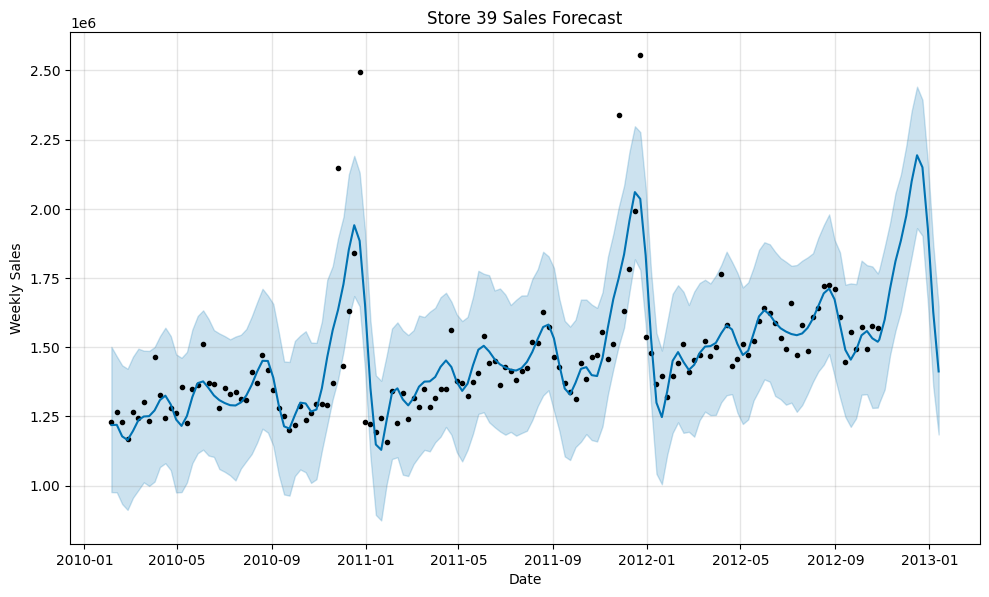

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/0vkyz2zl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/bh1ym3ca.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=11153', 'data', 'file=/tmp/tmpapqvvby3/0vkyz2zl.json', 'init=/tmp/tmpapqvvby3/bh1ym3ca.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_model2wlamq96/prophet_model-20250427074421.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 40...


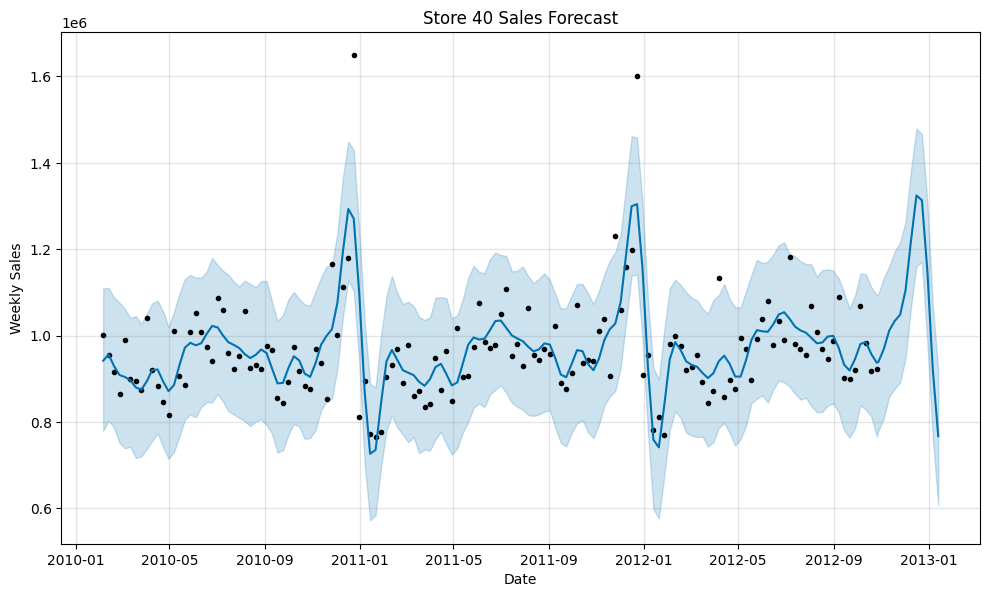

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/r7yjeaug.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/lhadcugb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=51725', 'data', 'file=/tmp/tmpapqvvby3/r7yjeaug.json', 'init=/tmp/tmpapqvvby3/lhadcugb.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_model5lpybki5/prophet_model-20250427074421.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 41...


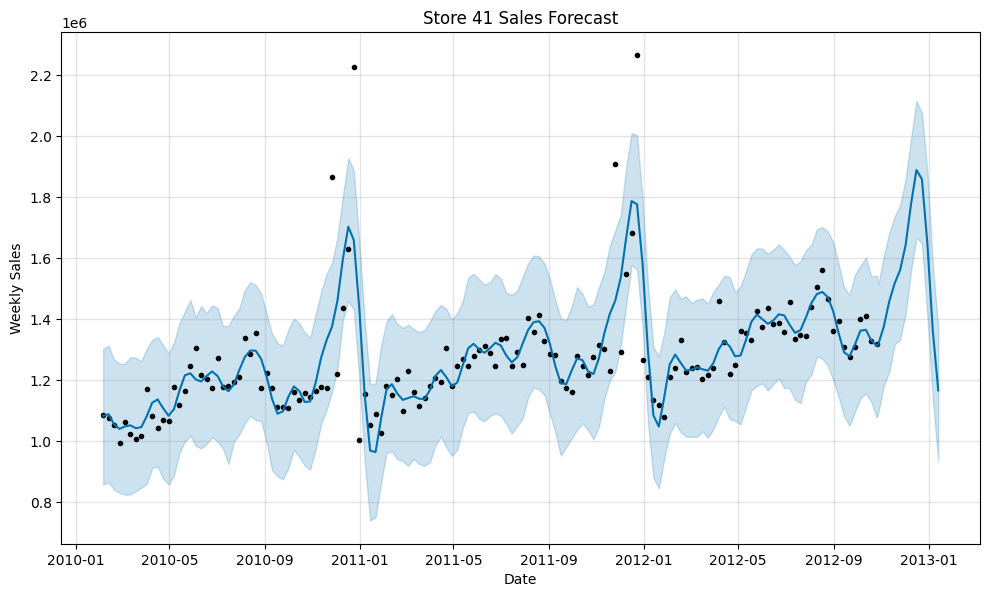

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/huqali3b.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/70ojs0q7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61866', 'data', 'file=/tmp/tmpapqvvby3/huqali3b.json', 'init=/tmp/tmpapqvvby3/70ojs0q7.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_modeleesltr3d/prophet_model-20250427074422.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 42...


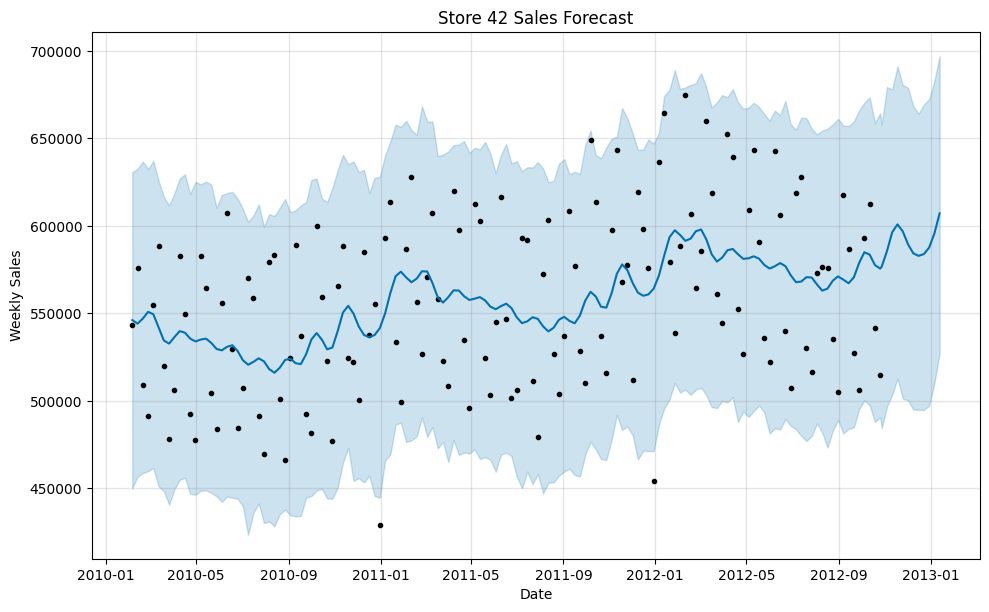

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/13q98fbu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/xqkugzjk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=40380', 'data', 'file=/tmp/tmpapqvvby3/13q98fbu.json', 'init=/tmp/tmpapqvvby3/xqkugzjk.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_model0ygyghvo/prophet_model-20250427074423.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 43...


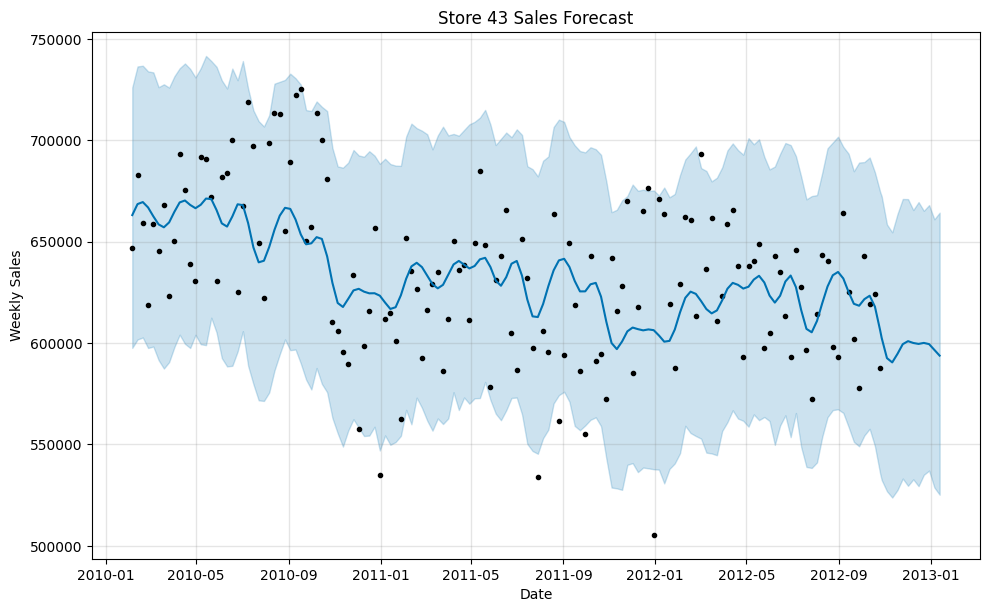

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/63gsxaey.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/sowk7yfc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=682', 'data', 'file=/tmp/tmpapqvvby3/63gsxaey.json', 'init=/tmp/tmpapqvvby3/sowk7yfc.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_model_9b8_lyw/prophet_model-20250427074423.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 44...


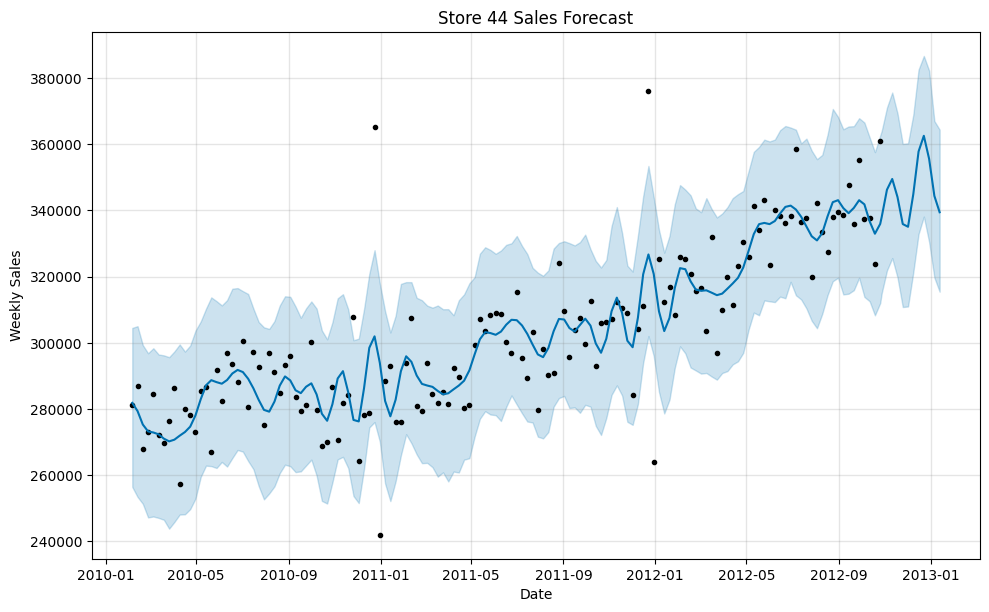

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/emlgie6k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpapqvvby3/1vitjyep.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34348', 'data', 'file=/tmp/tmpapqvvby3/emlgie6k.json', 'init=/tmp/tmpapqvvby3/1vitjyep.json', 'output', 'file=/tmp/tmpapqvvby3/prophet_model7qvsp26a/prophet_model-20250427074424.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:44:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:44:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Forecasting for Store 45...


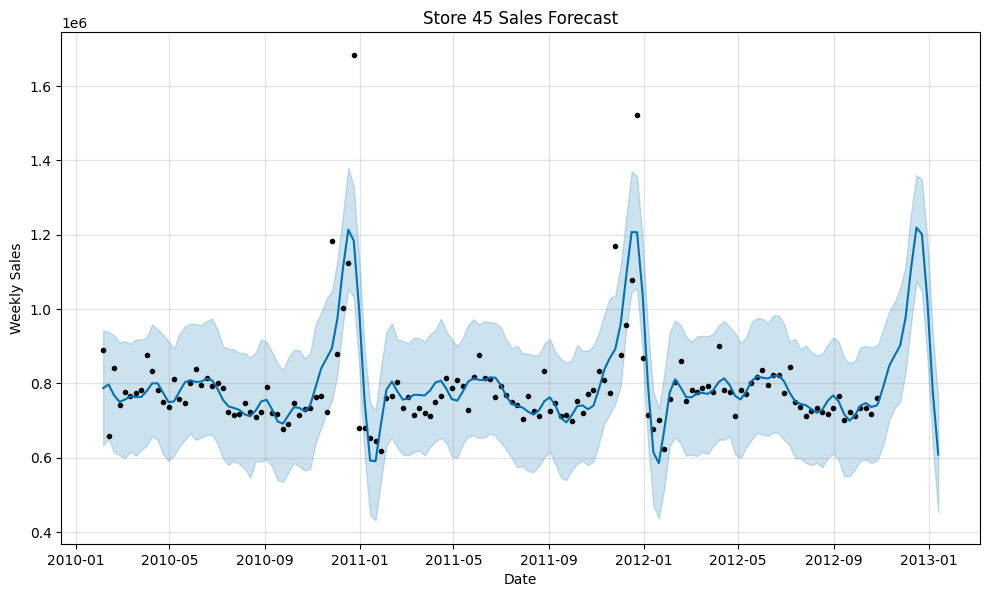

,ds,yhat,yhat_lower,yhat_upper
143,2012-10-28,317221.952132,269023.527769,362734.152662
144,2012-11-04,331588.838692,282938.662636,378418.820982
145,2012-11-11,364580.749006,315425.847587,412982.954172
146,2012-11-18,398231.987483,351142.906665,448445.092741
147,2012-11-25,416043.090286,365758.790492,463040.533069
148,2012-12-02,419179.166911,374819.332142,467474.678577
149,2012-12-09,420413.387669,376113.777781,467513.700067
150,2012-12-16,423956.539909,376026.862980,471518.208692
151,2012-12-23,417297.138900,371149.289251,465550.208521
152,2012-12-30,386826.512365,335382.342624,436470.039705


In [ ]:
# Loop over all stores and save forecast
all_forecasts = {}

for store in stores:
    print(f"Forecasting for Store {store}...")
    forecast = forecast_sales_for_store(store)
    all_forecasts[store] = forecast

# Example: See forecast for Store 5
all_forecasts[5]


In [ ]:
#Simpler method - Linear Regression

from sklearn.linear_model import LinearRegression

# Create 'Week_Number' to simulate time passing
df = df.sort_values(['Store', 'Date']).reset_index(drop=True)
df['Week_Number'] = df.groupby('Store').cumcount() + 1

# View sample
df.head()


,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Month,Year,Week_Number
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106,2,2010,1
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106,2,2010,2
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106,2,2010,3
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106,2,2010,4
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106,3,2010,5


In [ ]:
# Function to forecast using Linear Regression for one store

def forecast_sales_lr(store_number):
    # Filter data for store
    store_data = df[df['Store'] == store_number]

    # Prepare input features
    X = store_data[['Week_Number']]
    y = store_data['Weekly_Sales']

    # Train Linear Regression model
    model = LinearRegression()
    model.fit(X, y)

    # Predict future weeks (next 12 weeks)
    last_week = X['Week_Number'].max()
    future_weeks = np.arange(last_week+1, last_week+13).reshape(-1, 1)

    # Predict sales
    future_sales = model.predict(future_weeks)

    # Create DataFrame for predictions
    future_df = pd.DataFrame({
        'Week_Number': future_weeks.flatten(),
        'Predicted_Weekly_Sales': future_sales
    })

    # Plot
    plt.figure(figsize=(10,6))
    plt.plot(X['Week_Number'], y, label='Actual Sales')
    plt.plot(future_df['Week_Number'], future_df['Predicted_Weekly_Sales'], label='Predicted Sales (Next 12 Weeks)', color='red')
    plt.title(f"Sales Forecast for Store {store_number} (Linear Regression)")
    plt.xlabel('Week Number')
    plt.ylabel('Weekly Sales')
    plt.legend()
    plt.show()

    return future_df


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


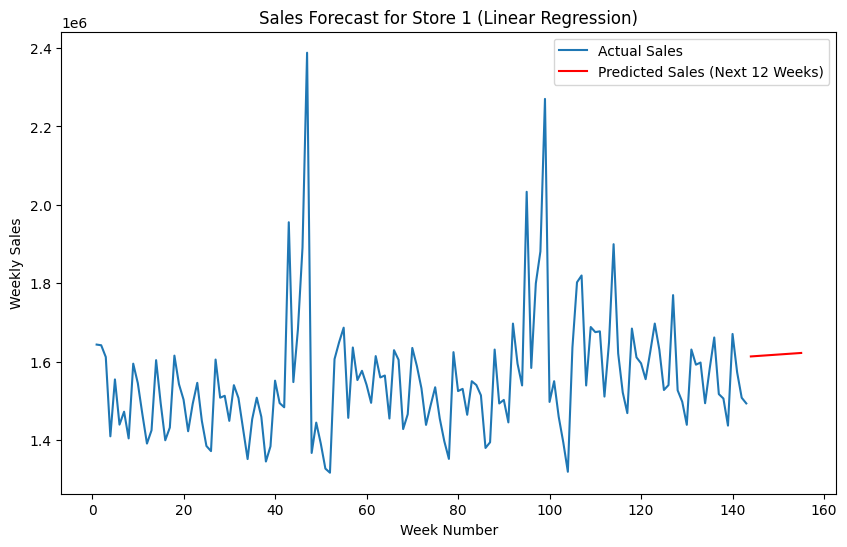

,Week_Number,Predicted_Weekly_Sales
0,144,1.613428e+06
1,145,1.614236e+06
2,146,1.615044e+06
3,147,1.615852e+06
4,148,1.616659e+06
5,149,1.617467e+06
6,150,1.618275e+06
7,151,1.619083e+06
8,152,1.619891e+06
9,153,1.620698e+06


In [ ]:
# Forecast for Store 1
forecast_store_1_lr = forecast_sales_lr(1)

# View forecasted values
forecast_store_1_lr


Forecasting for Store 1...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


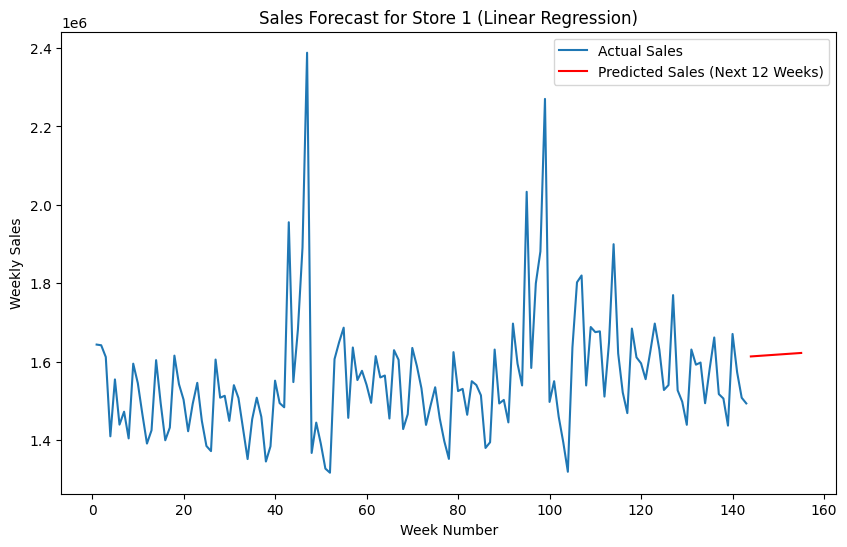

Forecasting for Store 2...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


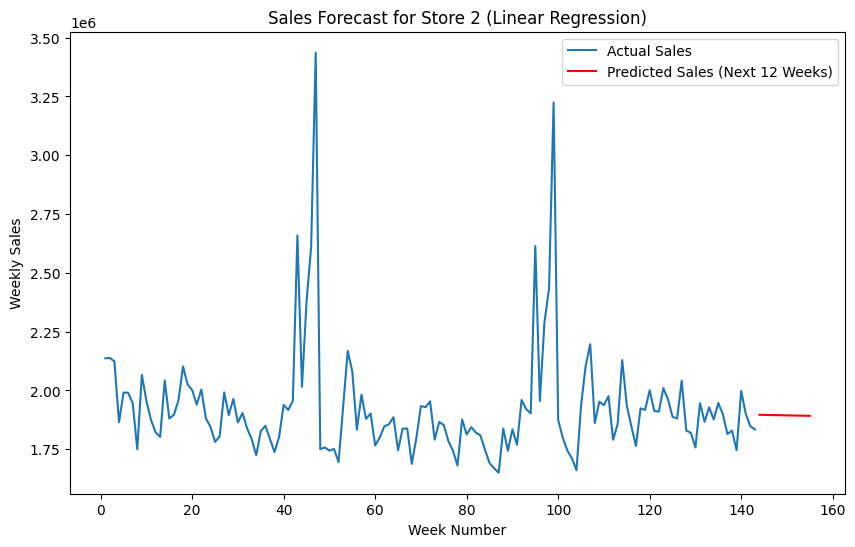

Forecasting for Store 3...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


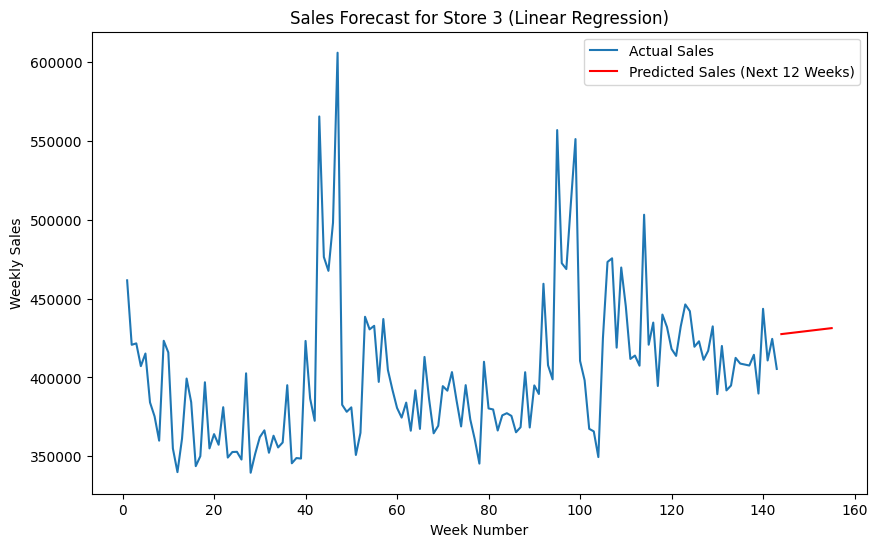

Forecasting for Store 4...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


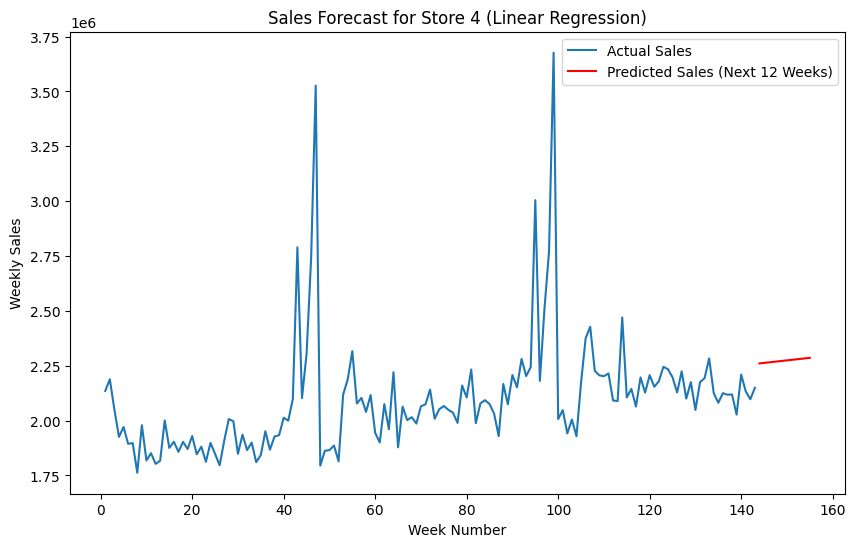

Forecasting for Store 5...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


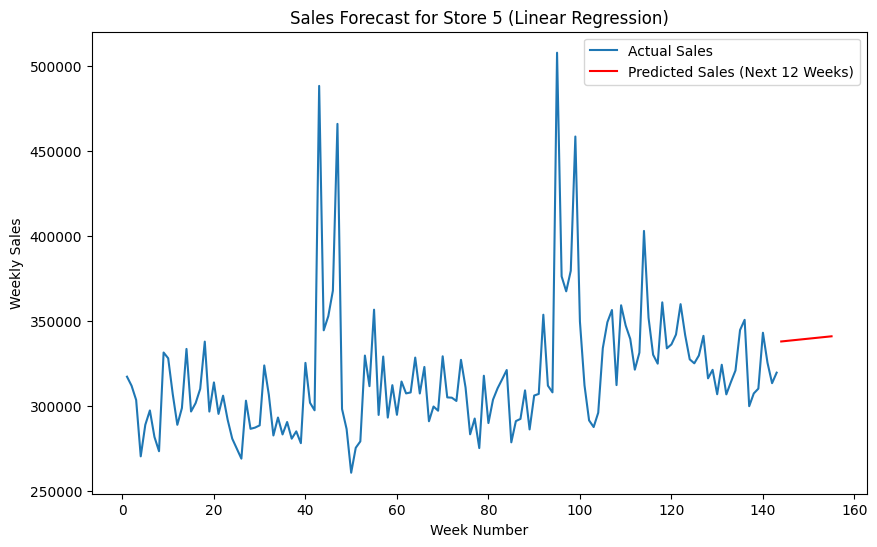

Forecasting for Store 6...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


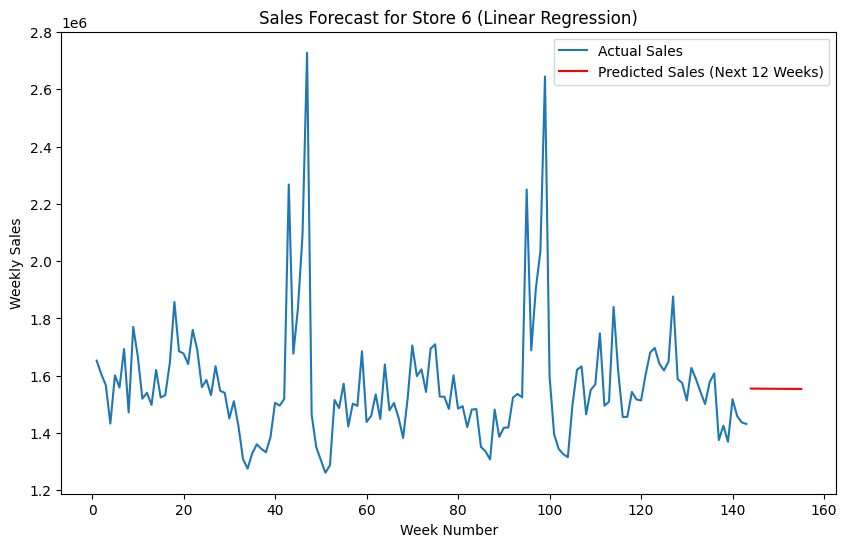

Forecasting for Store 7...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


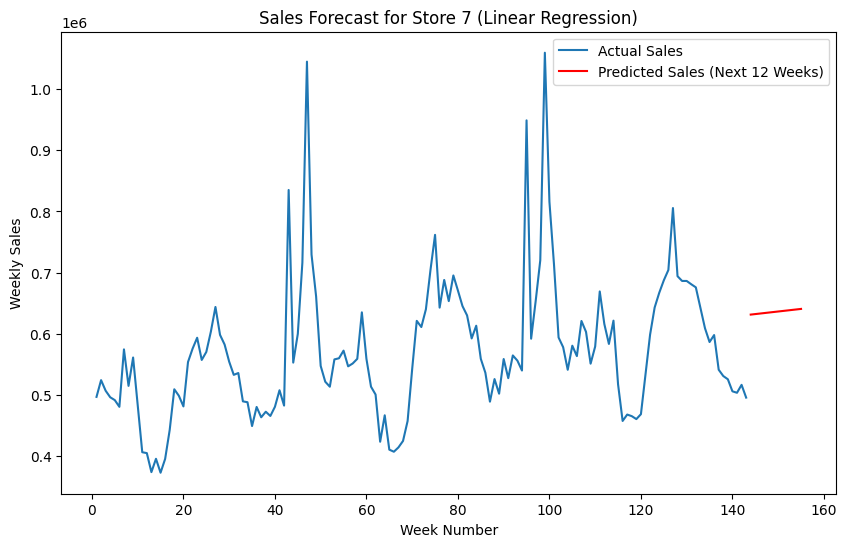

Forecasting for Store 8...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


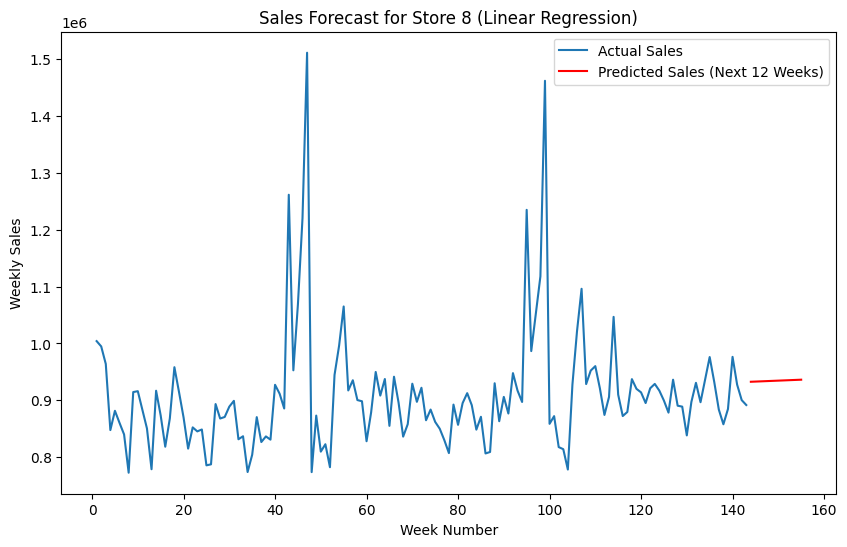

Forecasting for Store 9...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


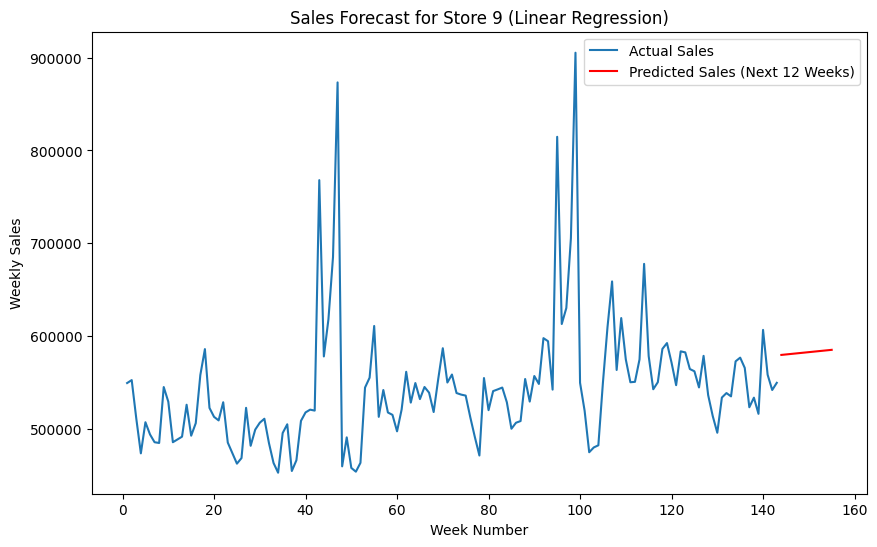

Forecasting for Store 10...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


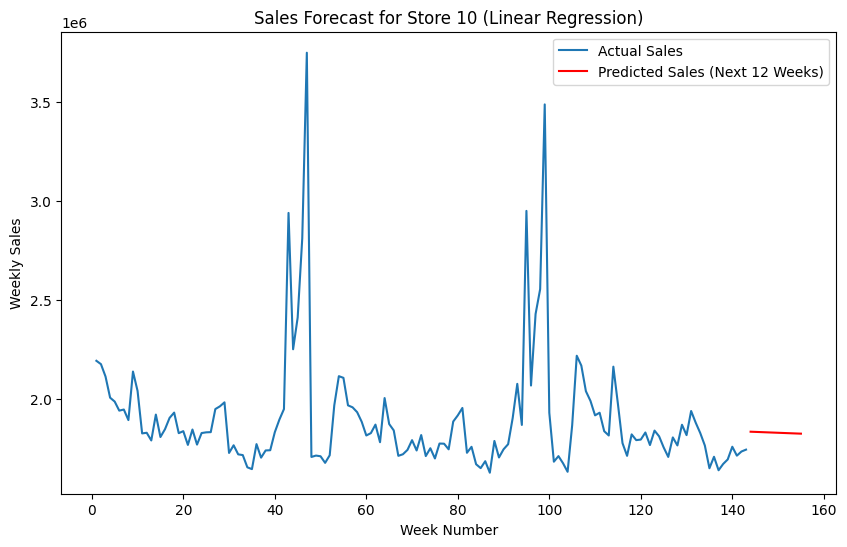

Forecasting for Store 11...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


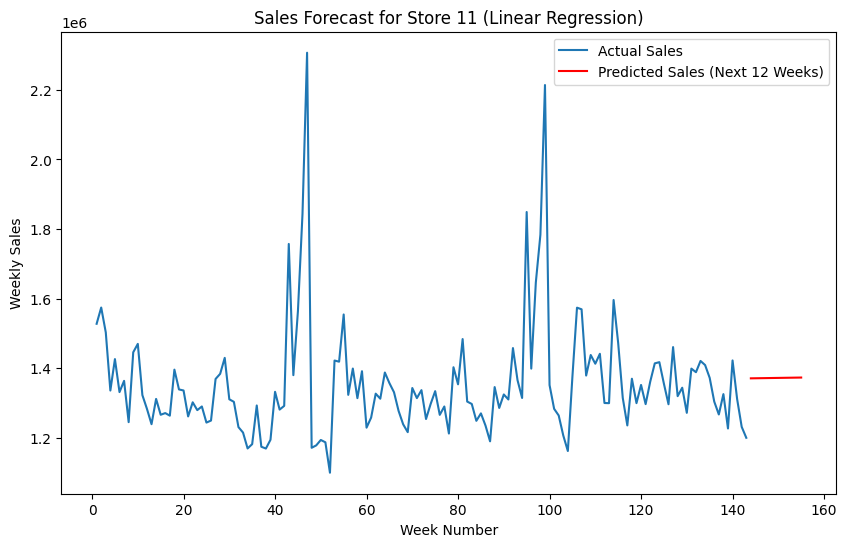

Forecasting for Store 12...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


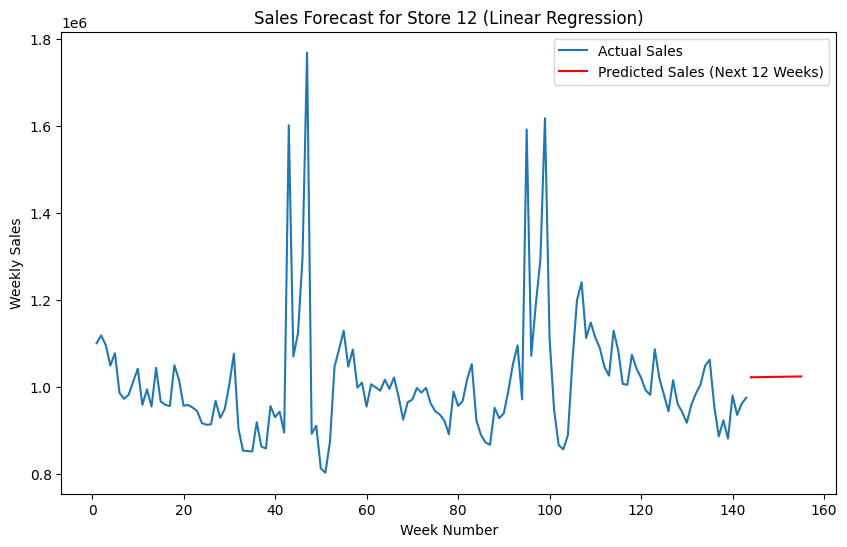

Forecasting for Store 13...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


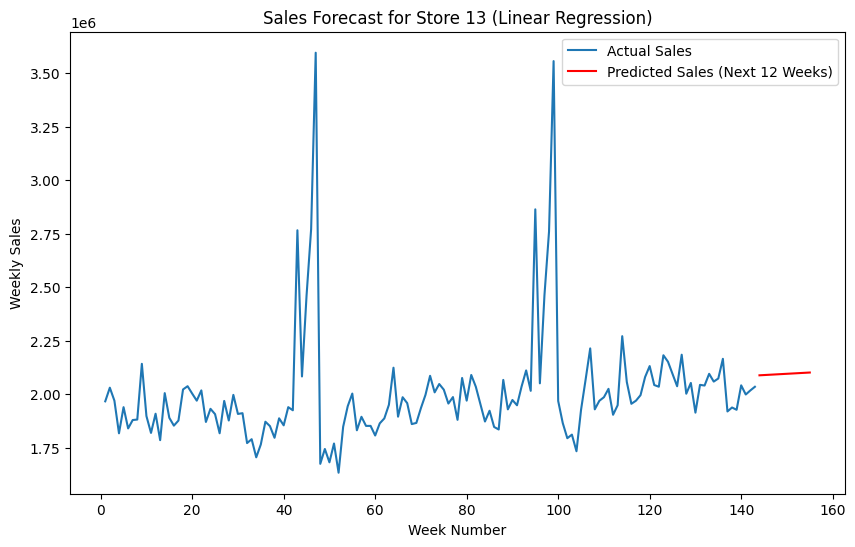

Forecasting for Store 14...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


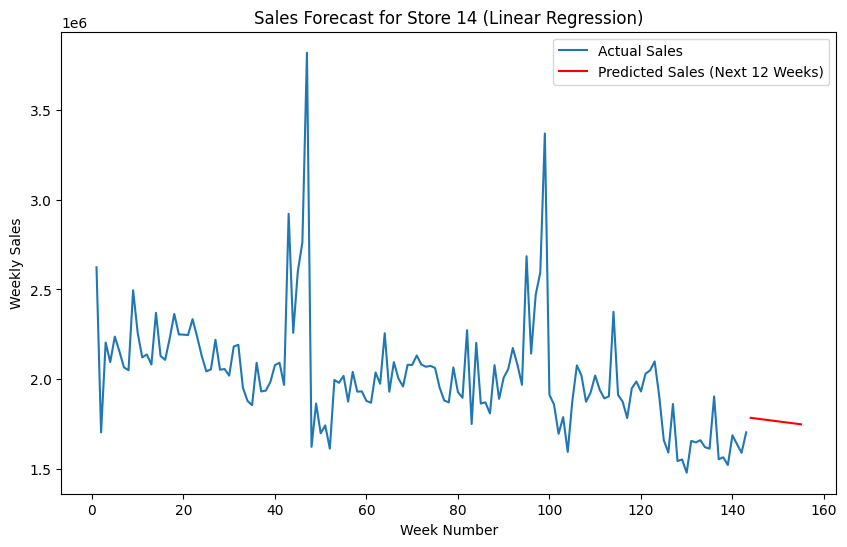

Forecasting for Store 15...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


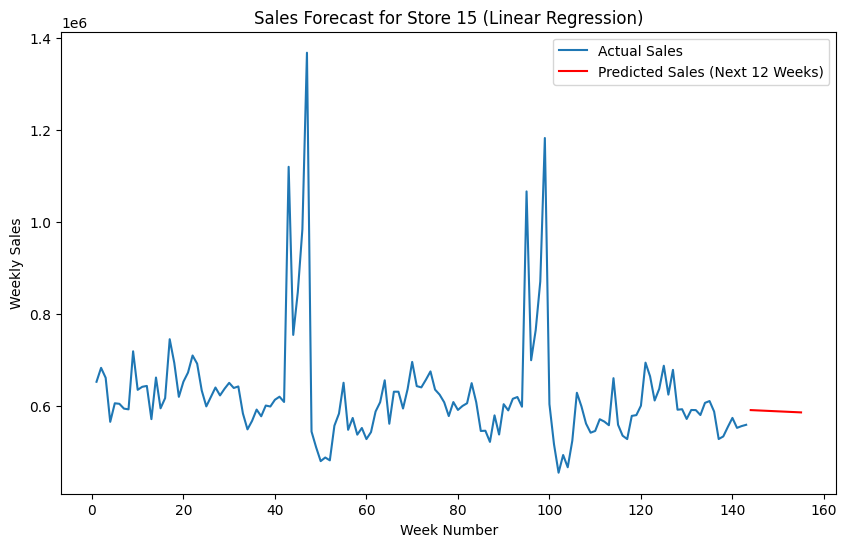

Forecasting for Store 16...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


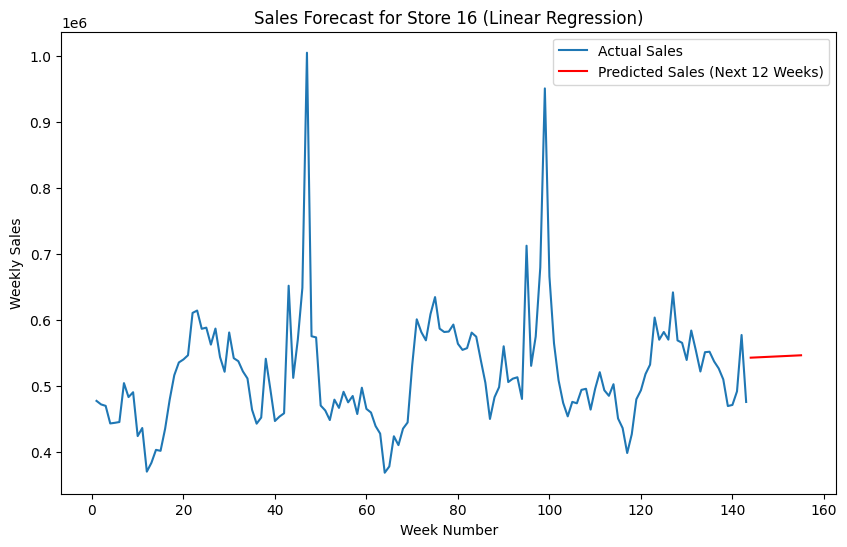

Forecasting for Store 17...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


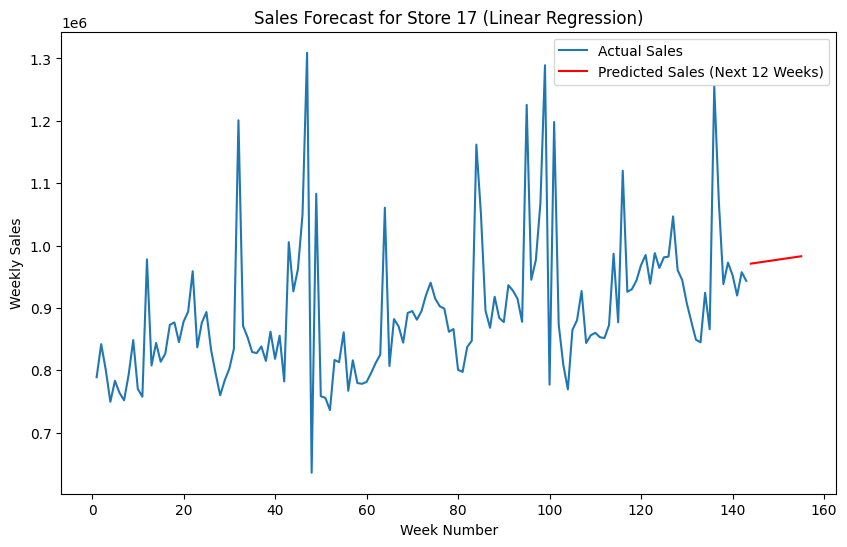

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


Forecasting for Store 18...


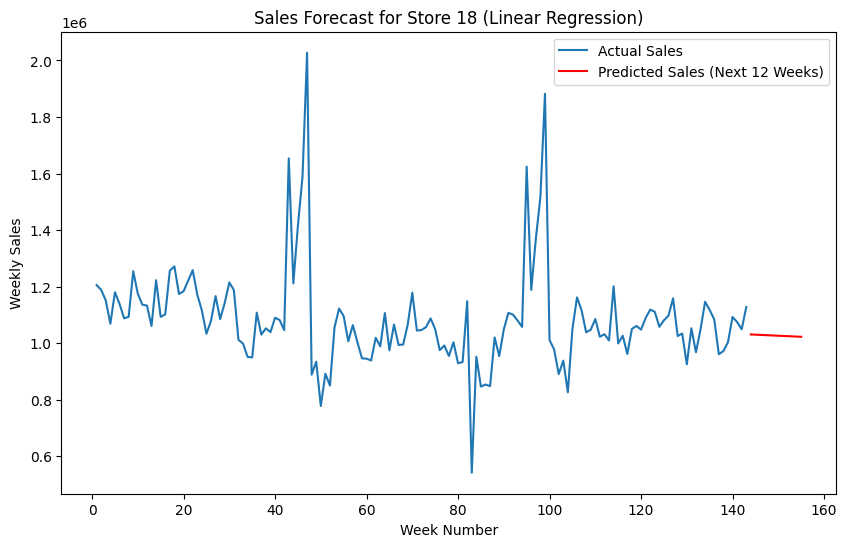

Forecasting for Store 19...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


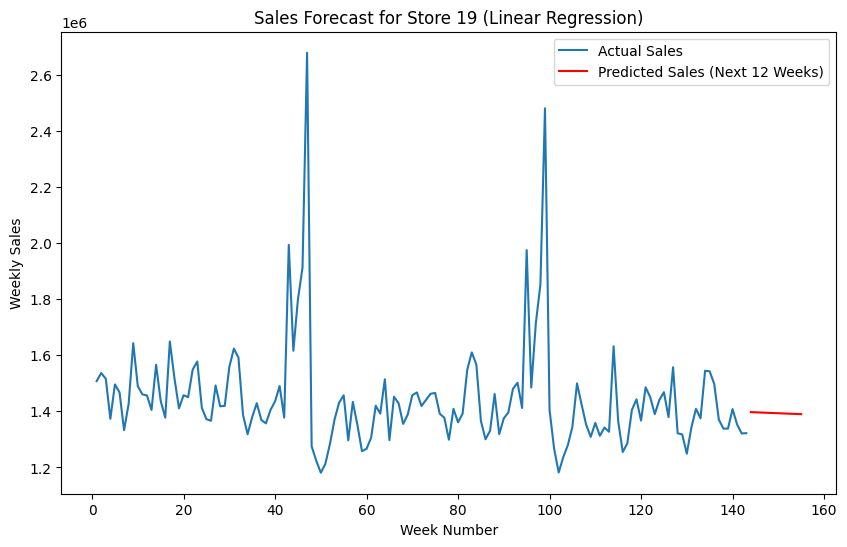

Forecasting for Store 20...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


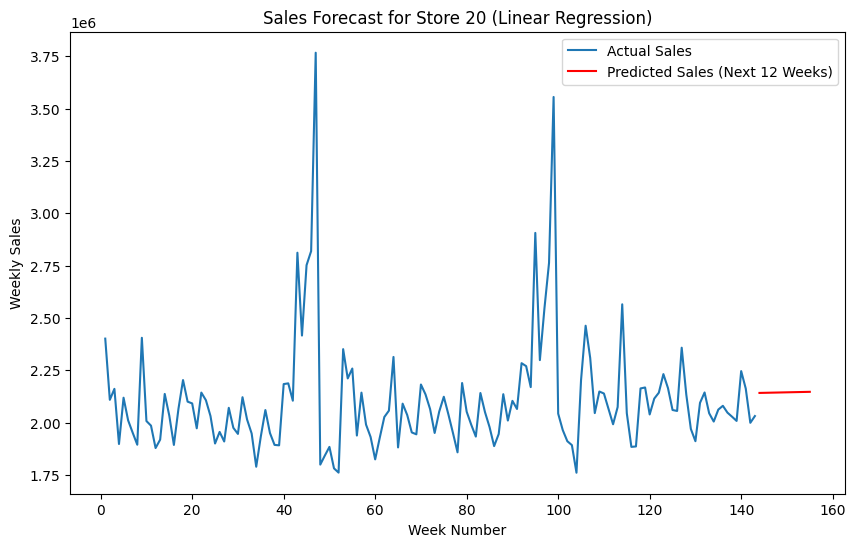

Forecasting for Store 21...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


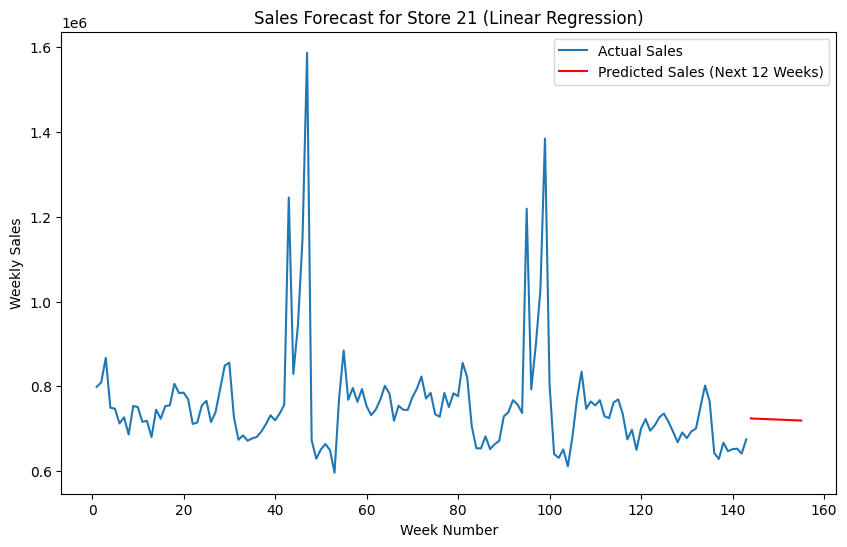

Forecasting for Store 22...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


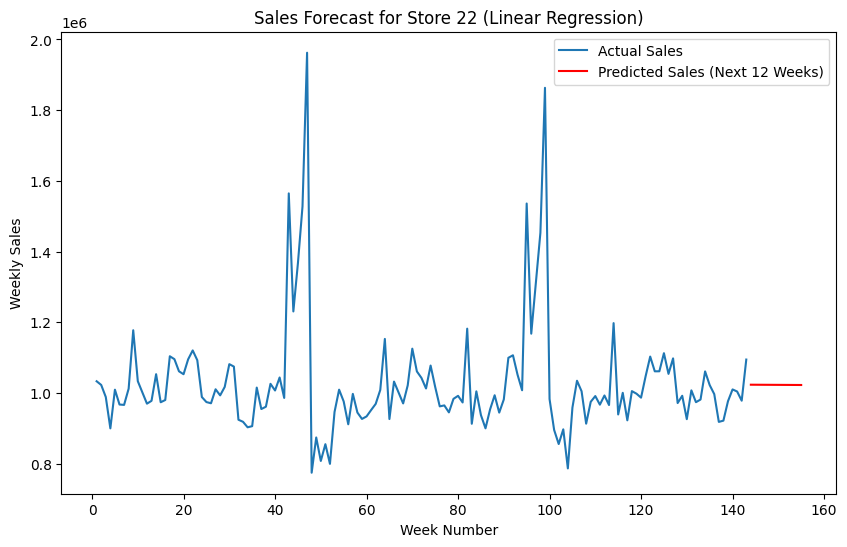

Forecasting for Store 23...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


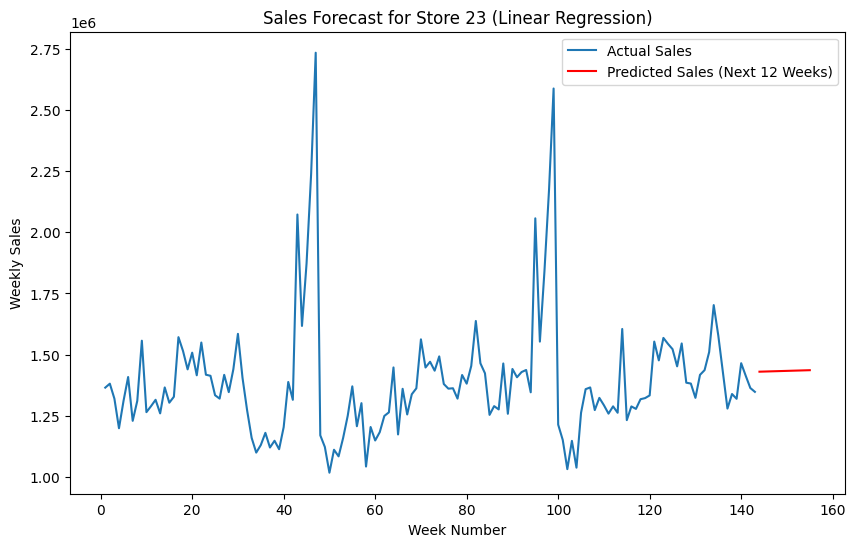

Forecasting for Store 24...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


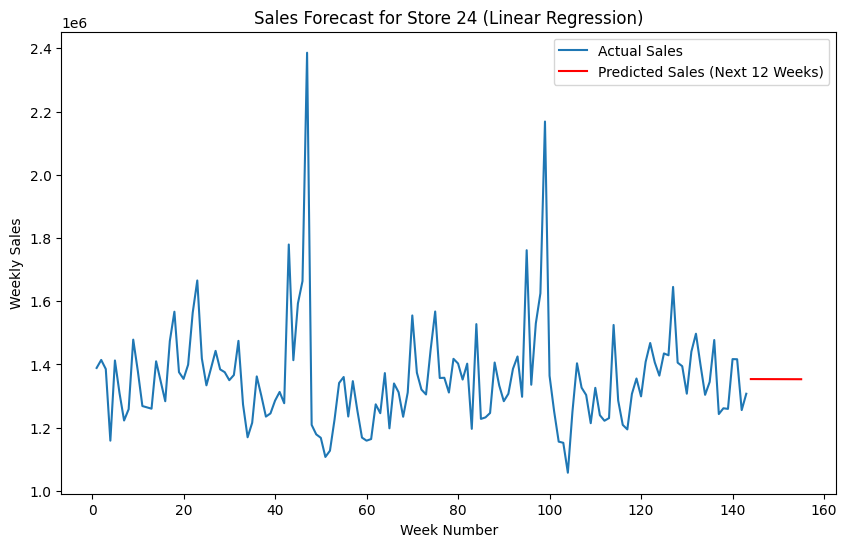

Forecasting for Store 25...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


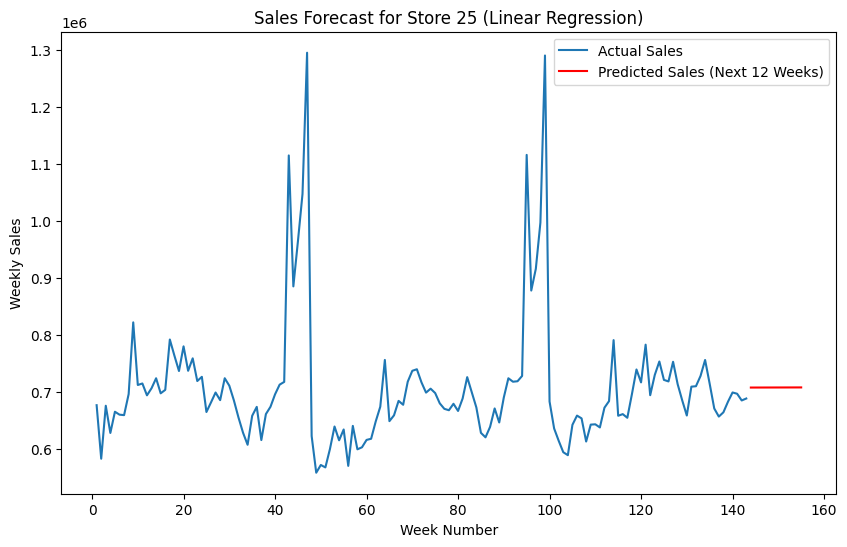

Forecasting for Store 26...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


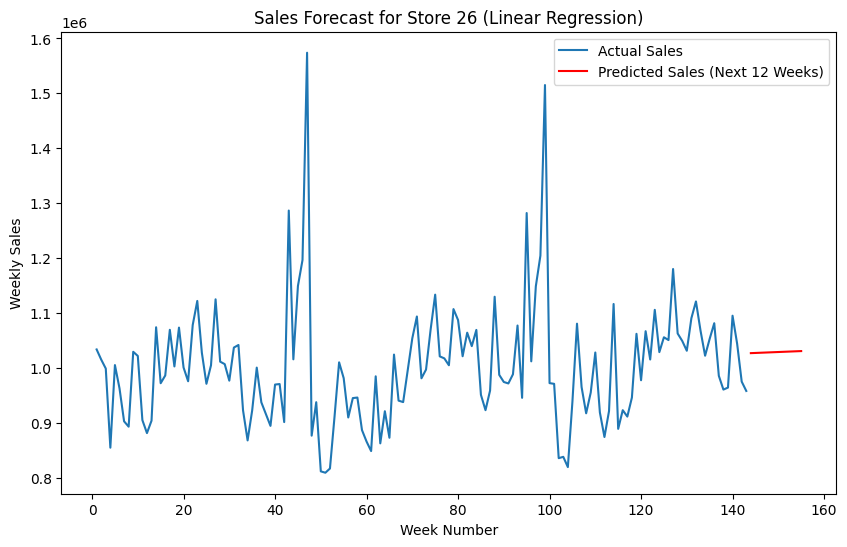

Forecasting for Store 27...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


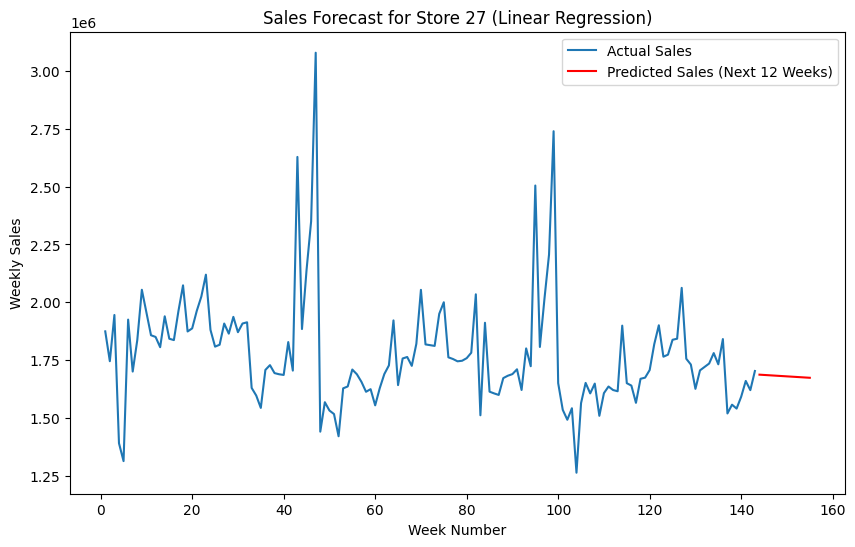

Forecasting for Store 28...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


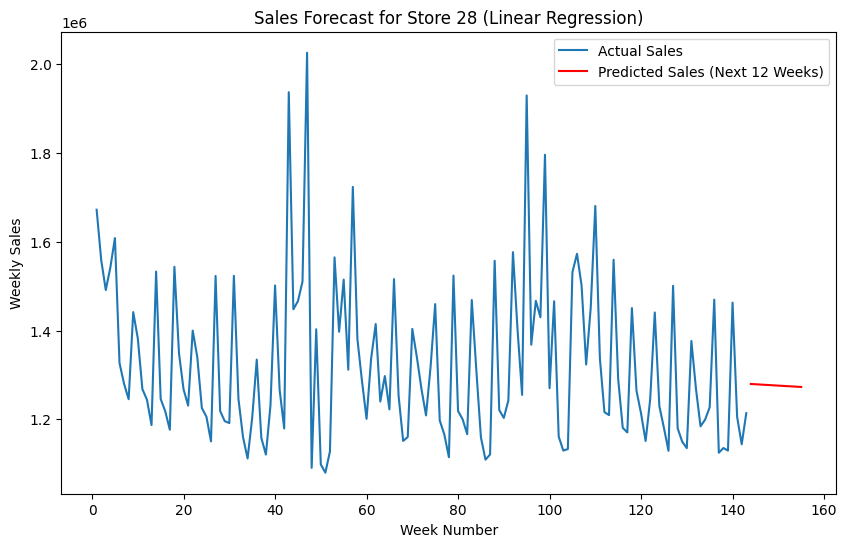

Forecasting for Store 29...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


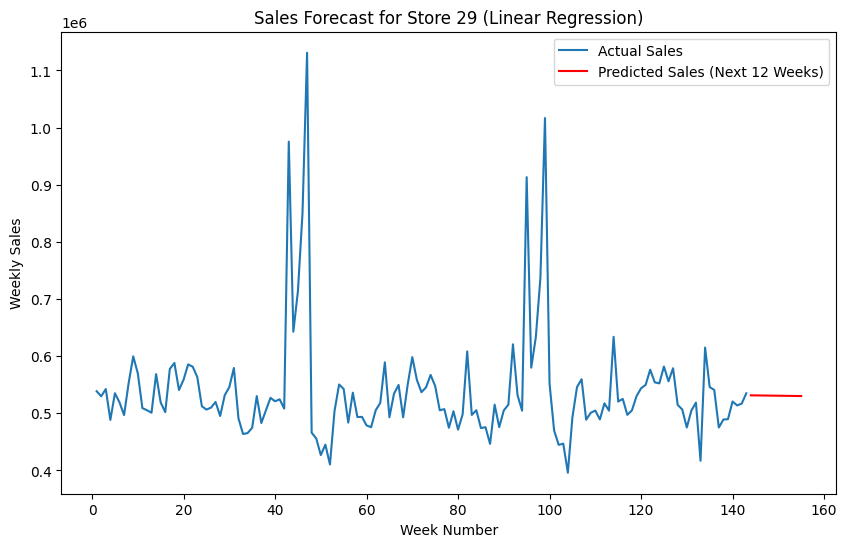

Forecasting for Store 30...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


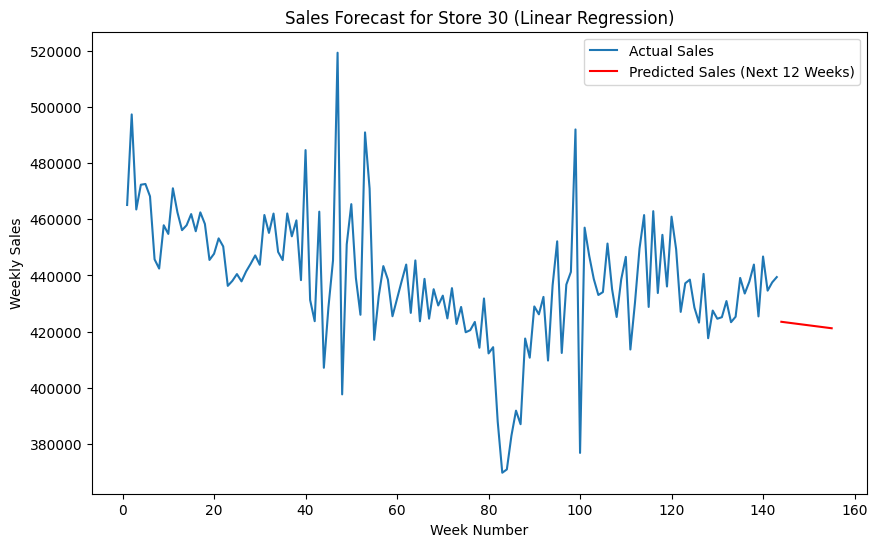

Forecasting for Store 31...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


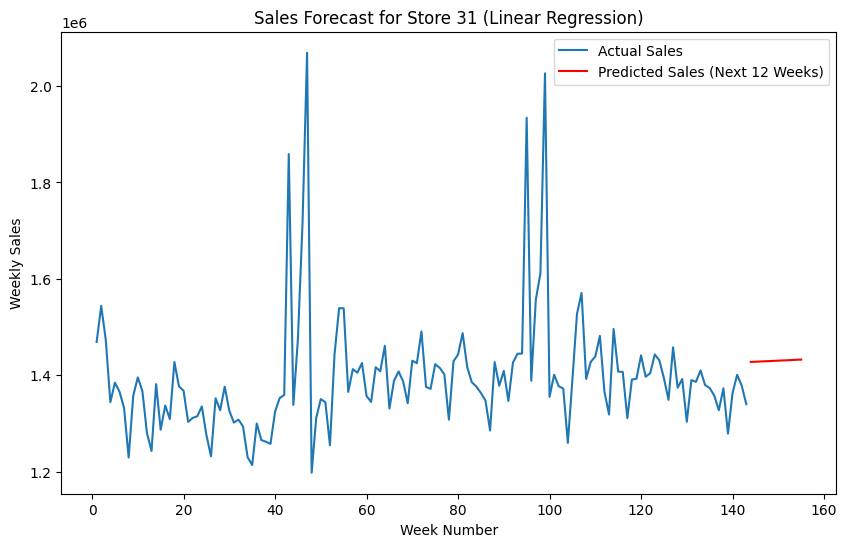

Forecasting for Store 32...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


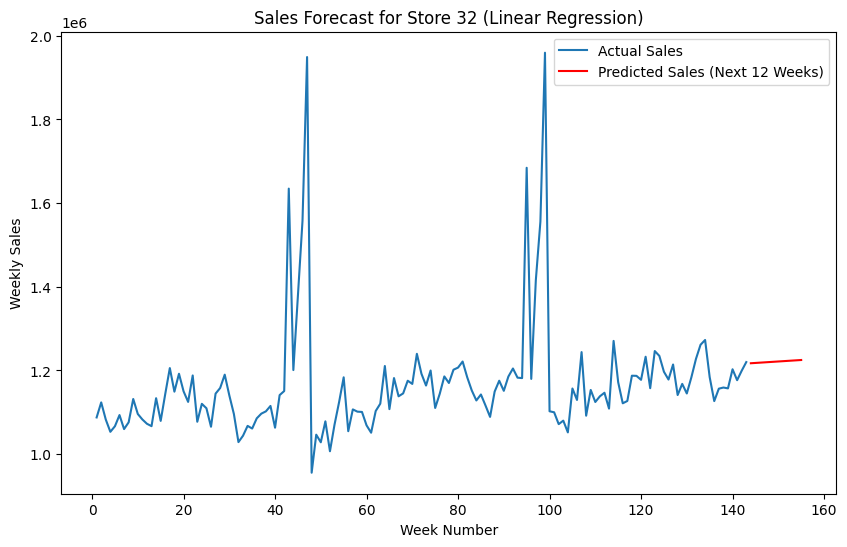

Forecasting for Store 33...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


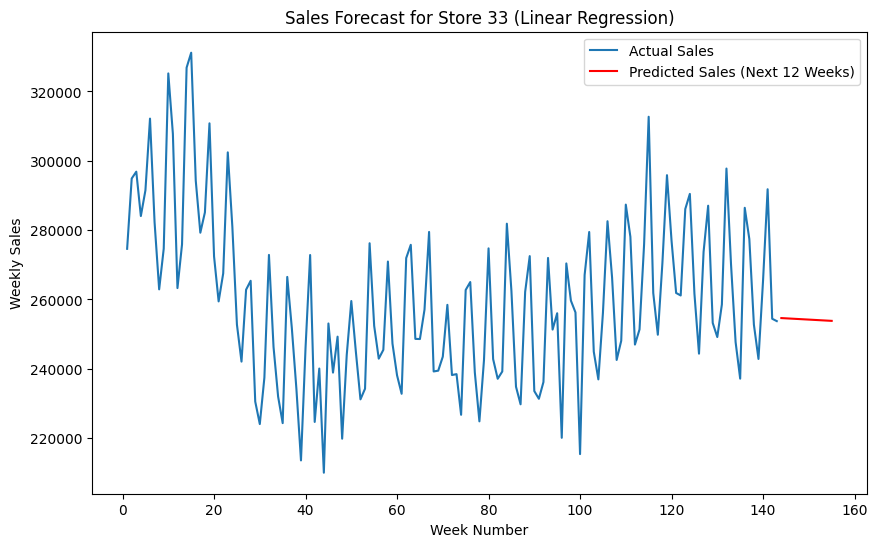

Forecasting for Store 34...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


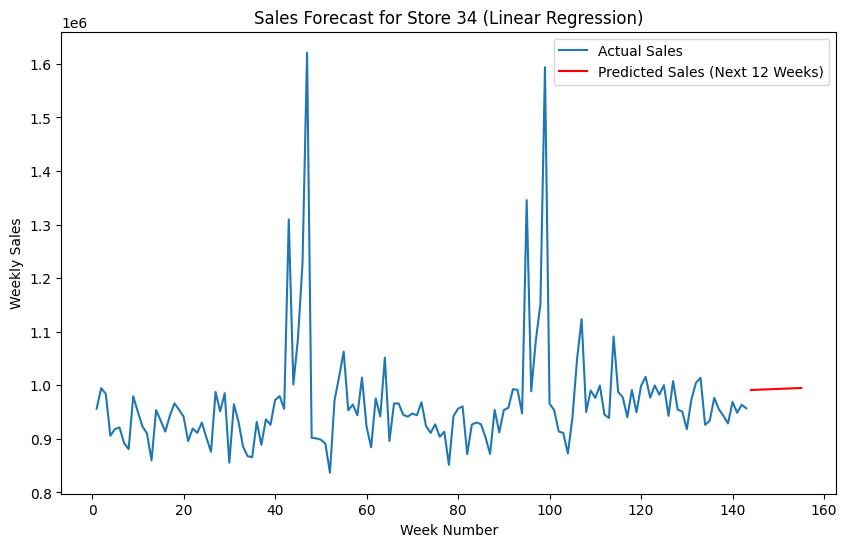

Forecasting for Store 35...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


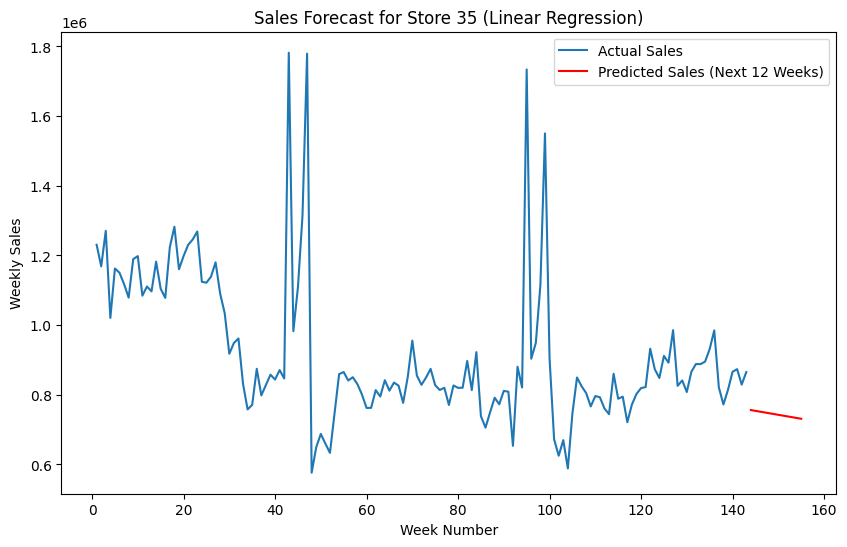

Forecasting for Store 36...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


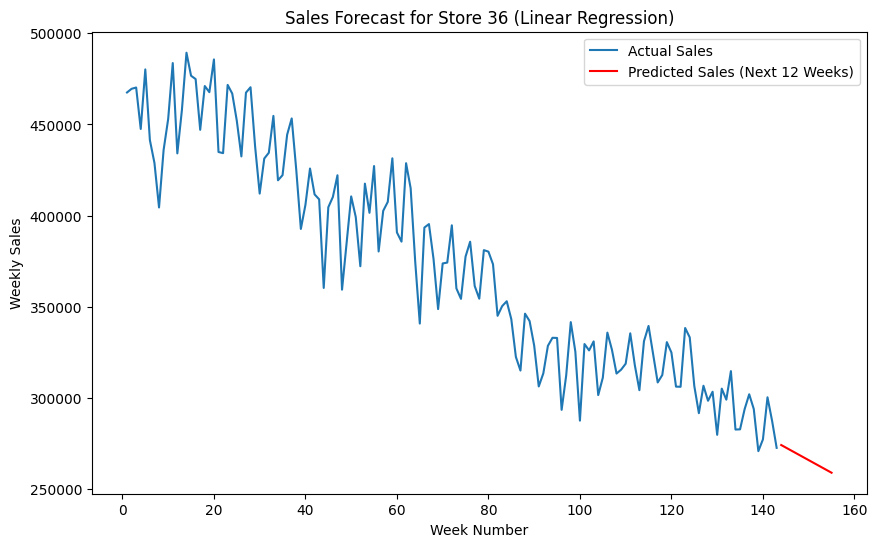

Forecasting for Store 37...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


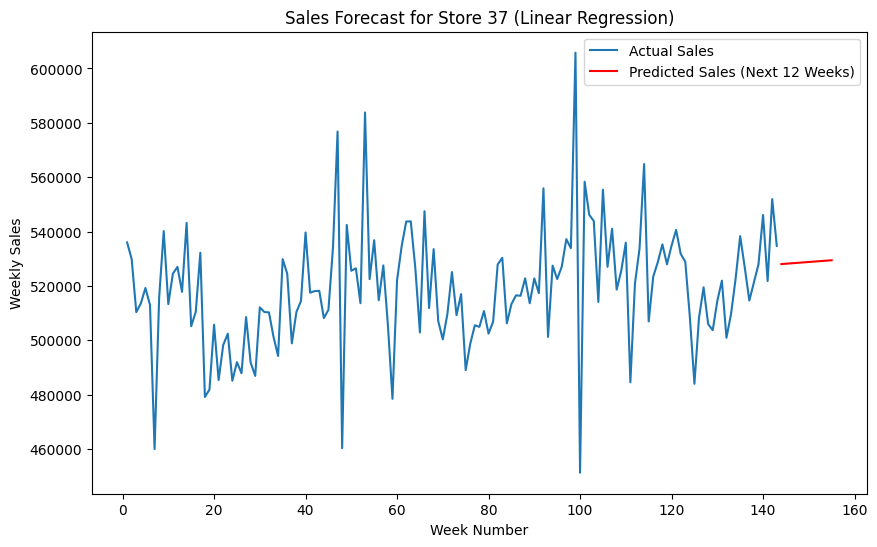

Forecasting for Store 38...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


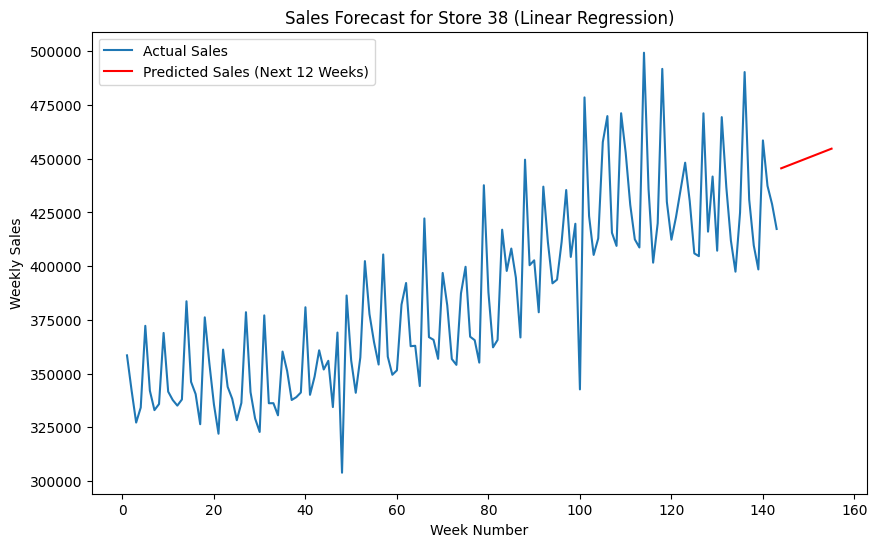

Forecasting for Store 39...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


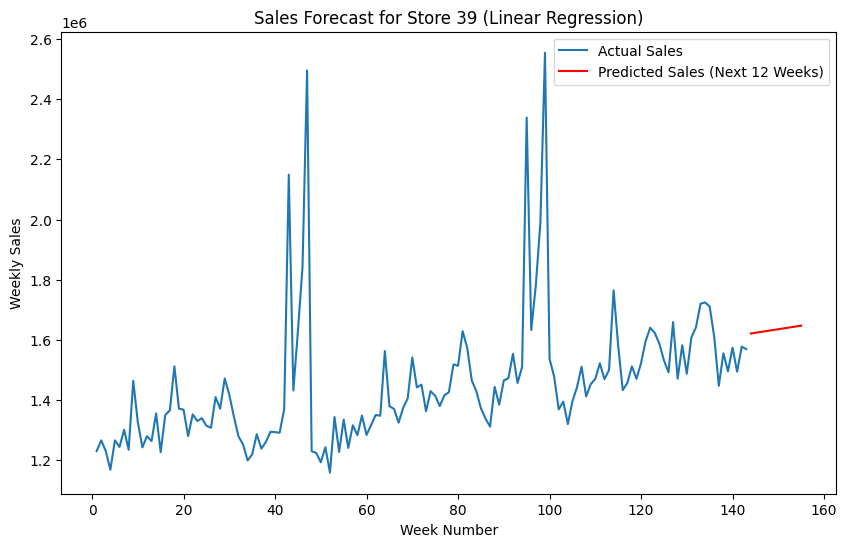

Forecasting for Store 40...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


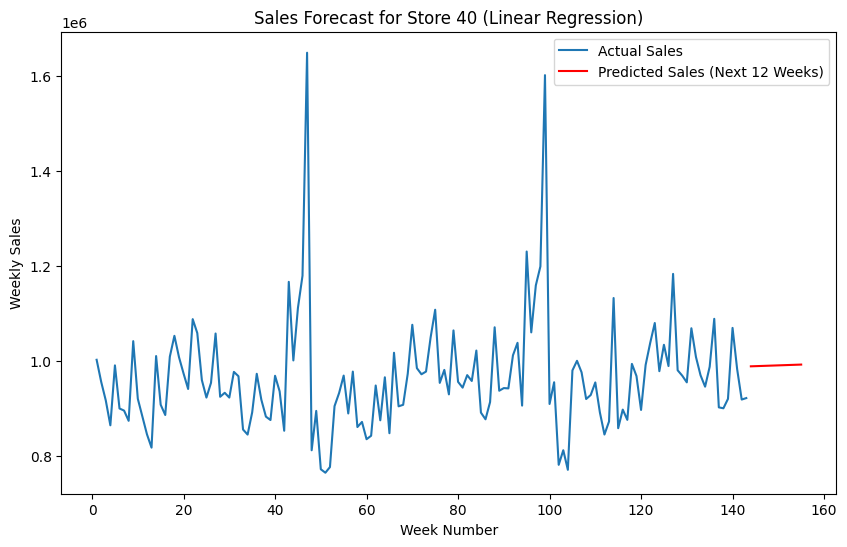

Forecasting for Store 41...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


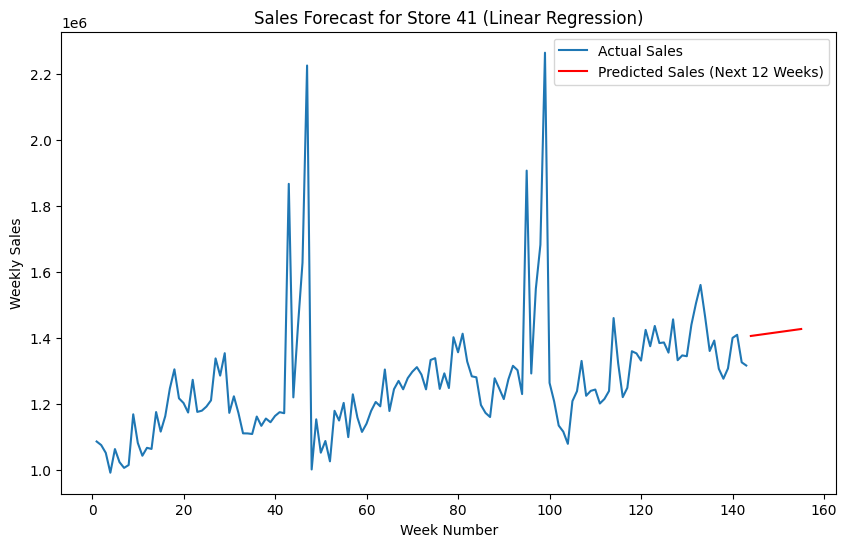

Forecasting for Store 42...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


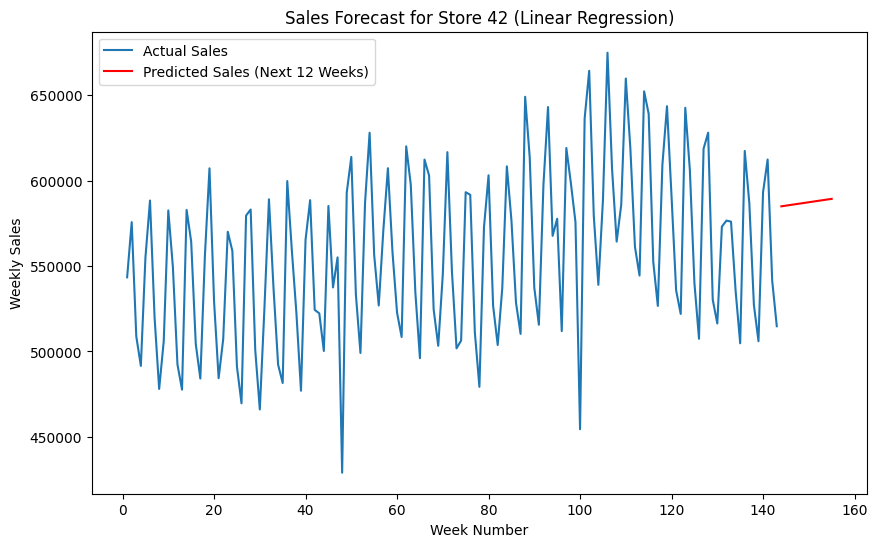

Forecasting for Store 43...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


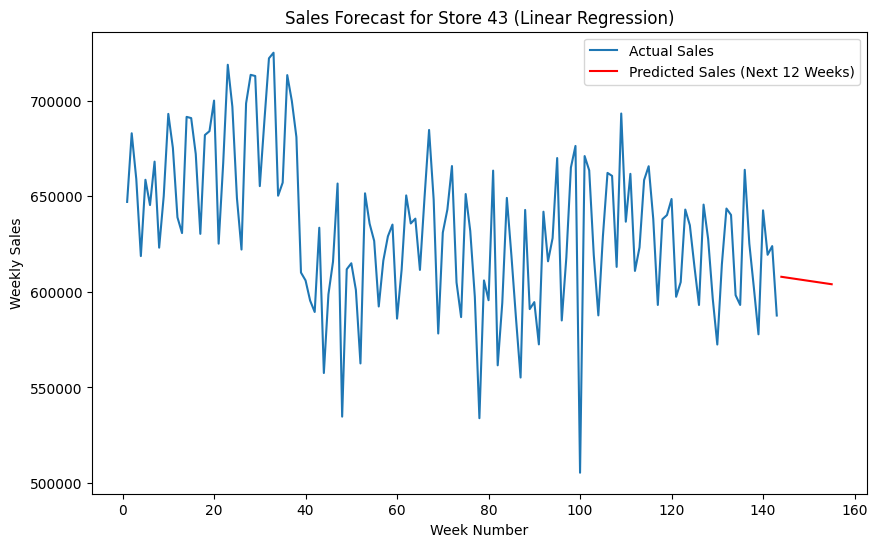

Forecasting for Store 44...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


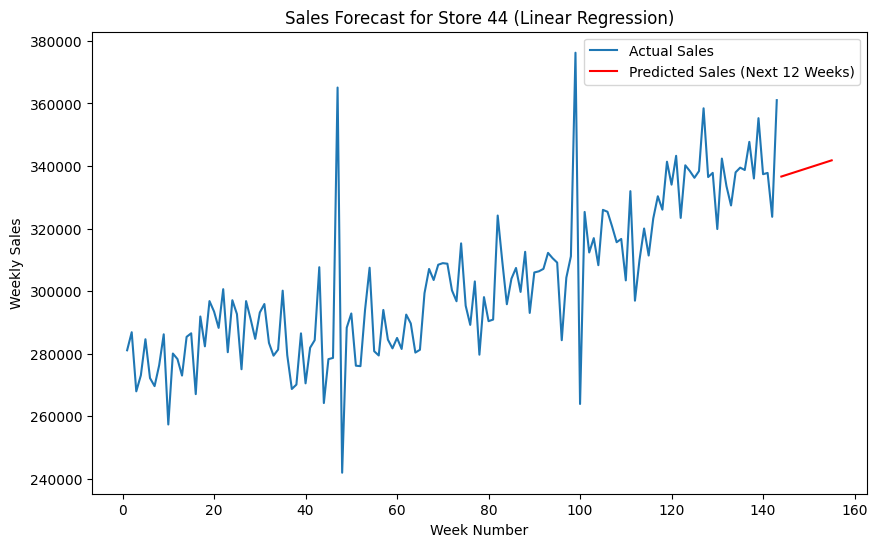

Forecasting for Store 45...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


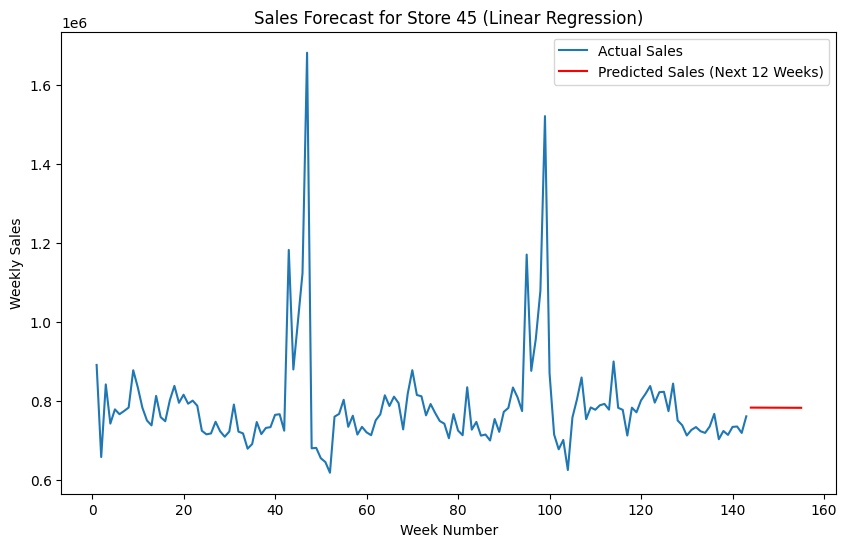

,Week_Number,Predicted_Weekly_Sales
0,144,337909.621987
1,145,338185.980480
2,146,338462.338973
3,147,338738.697466
4,148,339015.055959
5,149,339291.414452
6,150,339567.772945
7,151,339844.131438
8,152,340120.489931
9,153,340396.848424


In [ ]:
# Forecast for all stores and store results

stores = df['Store'].unique()
all_forecasts_lr = {}

for store in stores:
    print(f"Forecasting for Store {store}...")
    forecast = forecast_sales_lr(store)
    all_forecasts_lr[store] = forecast

# Example: see for Store 5
all_forecasts_lr[5]


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp8yk53d7t/7e523wau.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp8yk53d7t/o6rssooc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=91191', 'data', 'file=/tmp/tmp8yk53d7t/7e523wau.json', 'init=/tmp/tmp8yk53d7t/o6rssooc.json', 'output', 'file=/tmp/tmp8yk53d7t/prophet_modelb_39ff1f/prophet_model-20250517093149.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:31:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:31:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


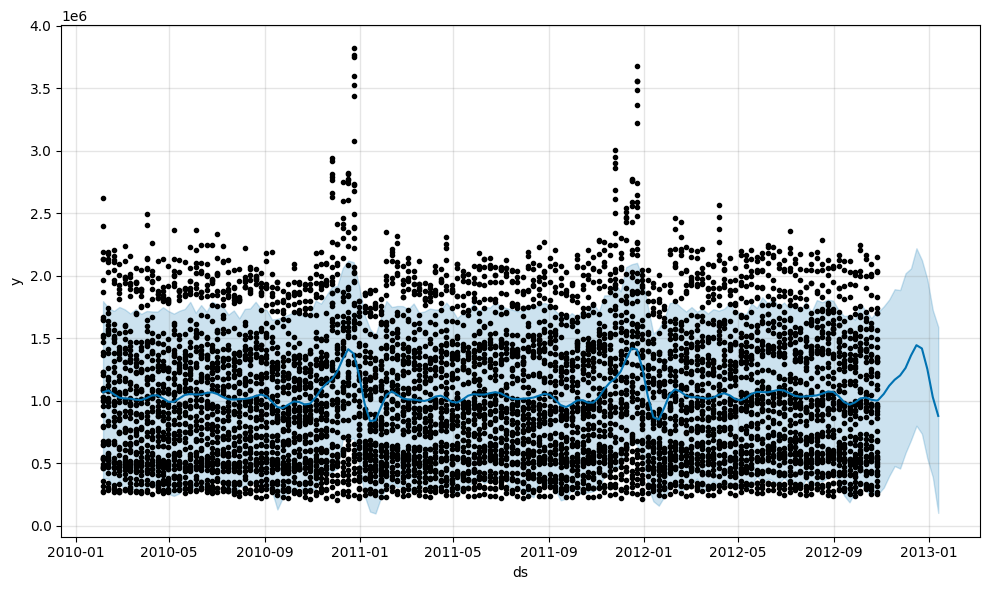

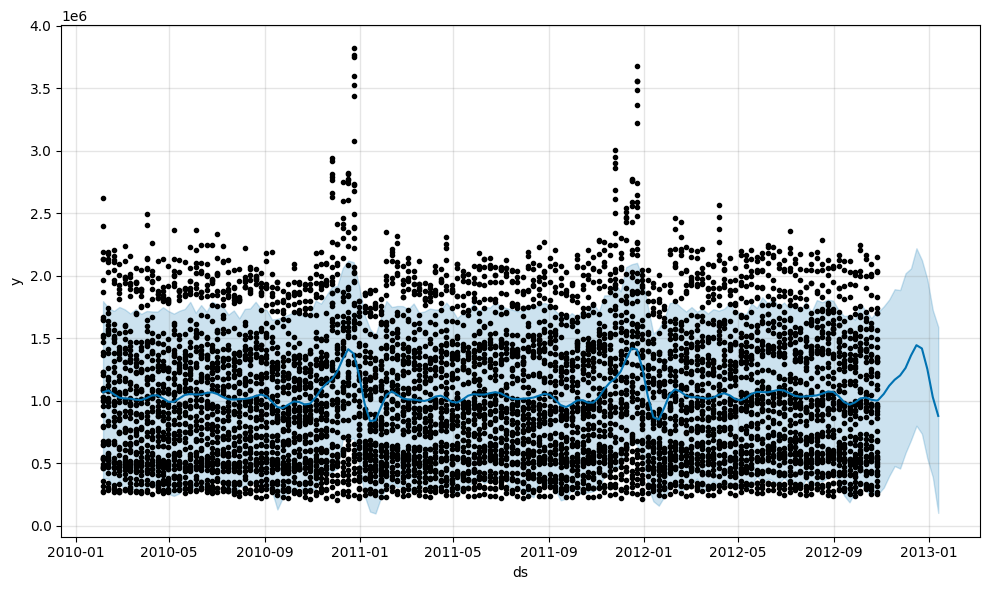

In [5]:
#Forecasting using ARIMA or Facebook Prophet

# Step 1: Convert 'Date' column to datetime format with day-first
df['Date'] = pd.to_datetime(df['Date'], format='%d-%m-%Y')

# Step 2: Rename for Prophet
df_prophet = df[['Date', 'Weekly_Sales']].rename(columns={'Date': 'ds', 'Weekly_Sales': 'y'})

# Step 3: Fit Prophet
from prophet import Prophet
model = Prophet()
model.fit(df_prophet)

# Step 4: Create future dataframe (12 weeks)
future = model.make_future_dataframe(periods=12, freq='W')
forecast = model.predict(future)

# Step 5: Plot
model.plot(forecast)
